In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import datetime
from dateutil.relativedelta import relativedelta
from datetime import date
from datetime import datetime
import seaborn as sns
%matplotlib inline

# import data

In [2]:
df= pd.read_excel("C:/Users/44742/Documents/Highways accident reporting data (to be used).xlsx", 
               na_values='')

C:\Users\44742\AppData\Local\Temp\ipykernel_8584\4253394476.py:1: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype=datetime64[ns])
  df= pd.read_excel("C:/Users/44742/Documents/Highways accident reporting data (to be used).xlsx",


In [3]:
df.head(3) 

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,Time into Shift,Impact,vehicles involved?,Type of Person,Location,...,Part of Body Affected,Injury Type,Experience in Current Role,Age Range,Weather / Visibility,Potential Severity Rating,Actual Severity Rating,Potential Severity Rating Score,"Above ground, on ground or below ground",Structural safety risk scores
0,131601,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 18:20:00,NaN,NaN,True,Employee,Carriageway Slip Rd K,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***
1,131600,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:00:00,NaN,NaN,False,Employee,Carriageway B,...,NaN,NaN,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***,NaN,***REDACTED***
2,131599,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-08 20:14:00,NaN,NaN,False,Employee,Carriageway Slip Rd J,...,NaN,NaN,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***,NaN,***REDACTED***


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64912 entries, 0 to 64911
Data columns (total 24 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   PublishedRecordId                        64912 non-null  int64         
 1   Region                                   64912 non-null  object        
 2   Site/Project                             64912 non-null  object        
 3    Event Type                              64912 non-null  object        
 4   Date and Time of Event                   64912 non-null  datetime64[ns]
 5   Time into Shift                          0 non-null      float64       
 6   Impact                                   0 non-null      float64       
 7   vehicles involved?                       62956 non-null  object        
 8   Type of Person                           64911 non-null  object        
 9   Location                               

In [5]:
a= df['Injury Type'].unique()

In [6]:
len(a) #there are 297 unique elements in site column

122

In [7]:
df[' Event Type'].unique() #different types of events classified

array(['Undesired Circumstance / Near Miss', 'Incursion / IPV Strike',
       'Infrastructure / Asset', 'Environmental',
       'Personal illness or injury', 'Structural Safety', 'Security',
       'Facilities / Site', 'Utility Strike'], dtype=object)

In [8]:
df=df.rename (columns= {' Event Type':'Event Type'} )

In [9]:
len(df['Event Type'].unique()) #number of event types classified

9

fig, ax = plt.subplots(facecolor="red")
ax.set_facecolor(color="green")
ax.plot([1,3,2,4], color="C1")

Text(0.5, 0, 'Frequency')

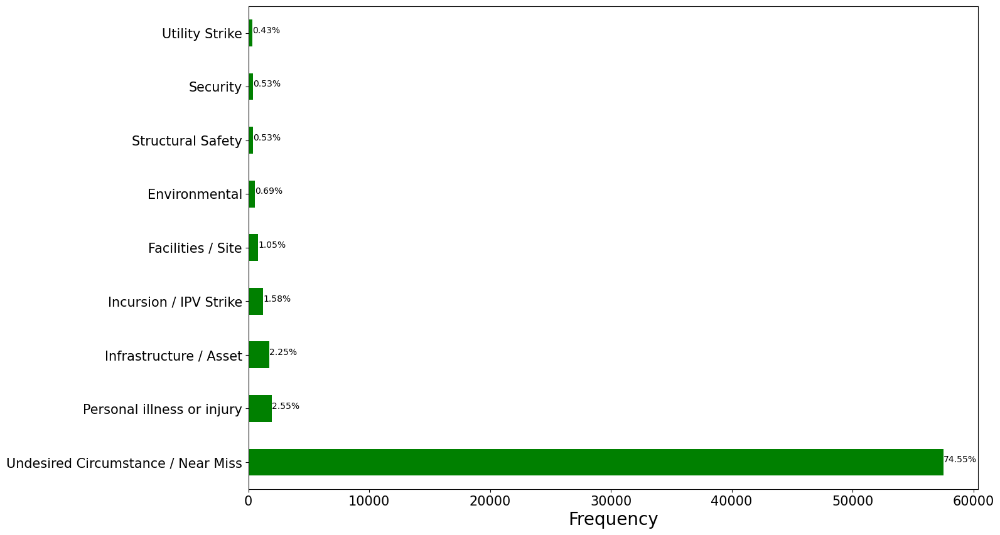

In [10]:
rcParams['figure.figsize']=15,10
s=df['Event Type'].value_counts()
ax= df['Event Type'].value_counts().plot(kind='barh', fontsize=15, color='green')
#ax.set_facecolor(color="green")
[ax.text(v, i, '{:.2f}%'.format(100*v/77149)) for i, v in enumerate(s)]
plt.xlabel('Frequency', fontsize='20')

# computing the 'time into shift' when incident happened

In [11]:
df['Date and Time of Event']= pd.to_datetime(df['Date and Time of Event'])

In [12]:
#computing the time into shift when incident happened
df['time2']=pd.Series(df['Date and Time of Event']) 
df['time1']=pd.Series(df['Shift Start Date and Time'])
df['Time into Shift'] = df['time2'] - df['time1']
df['Time into Shift']=df['Time into Shift']/np.timedelta64(1,'h')
for i in df['time1']:
    if i=='NaN':
        df['time1'] = pd.DatetimeIndex(df['Date and Time of Event']).time
df.head()

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,Time into Shift,Impact,vehicles involved?,Type of Person,Location,...,Experience in Current Role,Age Range,Weather / Visibility,Potential Severity Rating,Actual Severity Rating,Potential Severity Rating Score,"Above ground, on ground or below ground",Structural safety risk scores,time2,time1
0,131601,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 18:20:00,4.333333,NaN,True,Employee,Carriageway Slip Rd K,...,NaN,NaN,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-09 18:20:00,2022-08-09 14:00:00
1,131600,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:00:00,3.000000,NaN,False,Employee,Carriageway B,...,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-09 17:00:00,2022-08-09 14:00:00
2,131599,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-08 20:14:00,6.233333,NaN,False,Employee,Carriageway Slip Rd J,...,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-08 20:14:00,2022-08-08 14:00:00
3,131598,North West - Outstations & ROCs,Milness Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:10:00,3.166667,NaN,False,Employee,NaN,...,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-09 17:10:00,2022-08-09 14:00:00
4,131597,East - Operations,DBFO - M40 J1-15 Denham to Warwick (area 30),Undesired Circumstance / Near Miss,2022-08-08 12:30:00,5.500000,NaN,False,Contractor,Off Network e.g. Local Authority Road Footpath...,...,NaN,NaN,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-08 12:30:00,2022-08-08 07:00:00


# finding the 'season' when incident happened based on months

In [13]:
df['month'] = pd.DatetimeIndex(df['Date and Time of Event']).month

In [14]:
df['month'].unique()

array([ 8,  7,  6,  4,  5,  1,  3, 12,  2, 10, 11,  9], dtype=int64)

In [15]:
conditions=[(df['month']==12), (df['month']<3), (df['month']>=3) & (df['month']<6), (df['month']>=6) & (df['month']<9)
           , (df['month']>=9) & (df['month']<12)]

Values= ['Winter', 'Winter','Spring', 'Summer', 'Autumn']

df['Season'] = np.select(conditions, Values)
#df.loc[df['month']==12 & (df['month']<3), 'Season'] ='winter'
#df.loc[df['month']>=3 & (df['month']<6), 'Season'] ='Spring'

In [16]:
df['Season'].unique()

array(['Summer', 'Spring', 'Winter', 'Autumn'], dtype=object)

In [17]:
df.head(5)

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,Time into Shift,Impact,vehicles involved?,Type of Person,Location,...,Weather / Visibility,Potential Severity Rating,Actual Severity Rating,Potential Severity Rating Score,"Above ground, on ground or below ground",Structural safety risk scores,time2,time1,month,Season
0,131601,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 18:20:00,4.333333,NaN,True,Employee,Carriageway Slip Rd K,...,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-09 18:20:00,2022-08-09 14:00:00,8,Summer
1,131600,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:00:00,3.000000,NaN,False,Employee,Carriageway B,...,NaN,***REDACTED***,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-09 17:00:00,2022-08-09 14:00:00,8,Summer
2,131599,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-08 20:14:00,6.233333,NaN,False,Employee,Carriageway Slip Rd J,...,NaN,***REDACTED***,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-08 20:14:00,2022-08-08 14:00:00,8,Summer
3,131598,North West - Outstations & ROCs,Milness Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:10:00,3.166667,NaN,False,Employee,NaN,...,NaN,***REDACTED***,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-09 17:10:00,2022-08-09 14:00:00,8,Summer
4,131597,East - Operations,DBFO - M40 J1-15 Denham to Warwick (area 30),Undesired Circumstance / Near Miss,2022-08-08 12:30:00,5.500000,NaN,False,Contractor,Off Network e.g. Local Authority Road Footpath...,...,NaN,NaN,NaN,***REDACTED***,NaN,***REDACTED***,2022-08-08 12:30:00,2022-08-08 07:00:00,8,Summer


# count frequency of event type

In [18]:
df['Event Type'].value_counts()


Undesired Circumstance / Near Miss    57515
Personal illness or injury             1964
Infrastructure / Asset                 1733
Incursion / IPV Strike                 1219
Facilities / Site                       808
Environmental                           530
Structural Safety                       406
Security                                406
Utility Strike                          331
Name: Event Type, dtype: int64

In [19]:
#condition2= [(df['Event Type']=='Personal illness or injury'), (df['Event Type']=='Undesired Circumstance / Near Miss')
 #           (df['Event Type']=='Infrastructure / Asset'),(df['Event Type']=='Incursion / IPV Strike'),(df['Event Type']=='Facilities / Site')
  #          ,(df['Event Type']=='Environmental'),(df['Event Type']=='Structural Safety'),(df['Event Type']=='Security')
   #         ,(df['Event Type']=='Utility Strike')] 
#values= [1964, 57515, 1733, 1219, 808, 530, 406, 406, 331]
#df['Frequency'] = np.select(condition2, values)

In [20]:
df['Frequency']=df['Event Type'].value_counts()

df['Frequency']

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
64907   NaN
64908   NaN
64909   NaN
64910   NaN
64911   NaN
Name: Frequency, Length: 64912, dtype: float64

# Simulating the values for 'Actual Severity Rating' and 'Potential Severity Rating Score'

In [21]:
#put random numbers between 1 and 20 as severity ratings
df['Actual Severity Rating']= np.random.randint(1, 24, df.shape[0])
df['Potential Severity Rating']= np.random.randint(1, 24, df.shape[0])


In [22]:
#but personal injuries are worst so make that 25
df.loc[df['Event Type']=='Personal illness or injury', 'Actual Severity Rating']=25
df.loc[df['Event Type']=='Personal illness or injury', 'Potential Severity Rating']=25

In [23]:
df.loc[df['Event Type']=='Undesired Circumstance / Near Miss', 'Actual Severity Rating']=np.random.randint(5,13)

In [24]:
df.loc[df['Event Type']=='Personal illness or injury', 'Actual Severity Rating']

16       25
38       25
43       25
54       25
94       25
         ..
64784    25
64807    25
64808    25
64812    25
64819    25
Name: Actual Severity Rating, Length: 1964, dtype: int32

In [25]:
df.head(1)

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,Time into Shift,Impact,vehicles involved?,Type of Person,Location,...,Potential Severity Rating,Actual Severity Rating,Potential Severity Rating Score,"Above ground, on ground or below ground",Structural safety risk scores,time2,time1,month,Season,Frequency
0,131601,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 18:20:00,4.333333,NaN,True,Employee,Carriageway Slip Rd K,...,1,12,***REDACTED***,NaN,***REDACTED***,2022-08-09 18:20:00,2022-08-09 14:00:00,8,Summer,NaN


# computing risk score which is the severity multiplied by the frequency

In [26]:
#df['Structural safety risk scores']= df['Frequency']*df['Actual Severity Rating']

In [27]:
df.head(5)

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,Time into Shift,Impact,vehicles involved?,Type of Person,Location,...,Potential Severity Rating,Actual Severity Rating,Potential Severity Rating Score,"Above ground, on ground or below ground",Structural safety risk scores,time2,time1,month,Season,Frequency
0,131601,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 18:20:00,4.333333,NaN,True,Employee,Carriageway Slip Rd K,...,1,12,***REDACTED***,NaN,***REDACTED***,2022-08-09 18:20:00,2022-08-09 14:00:00,8,Summer,NaN
1,131600,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:00:00,3.000000,NaN,False,Employee,Carriageway B,...,8,12,***REDACTED***,NaN,***REDACTED***,2022-08-09 17:00:00,2022-08-09 14:00:00,8,Summer,NaN
2,131599,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-08 20:14:00,6.233333,NaN,False,Employee,Carriageway Slip Rd J,...,18,12,***REDACTED***,NaN,***REDACTED***,2022-08-08 20:14:00,2022-08-08 14:00:00,8,Summer,NaN
3,131598,North West - Outstations & ROCs,Milness Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:10:00,3.166667,NaN,False,Employee,NaN,...,2,12,***REDACTED***,NaN,***REDACTED***,2022-08-09 17:10:00,2022-08-09 14:00:00,8,Summer,NaN
4,131597,East - Operations,DBFO - M40 J1-15 Denham to Warwick (area 30),Undesired Circumstance / Near Miss,2022-08-08 12:30:00,5.500000,NaN,False,Contractor,Off Network e.g. Local Authority Road Footpath...,...,18,12,***REDACTED***,NaN,***REDACTED***,2022-08-08 12:30:00,2022-08-08 07:00:00,8,Summer,NaN


In [28]:
df=df.drop(columns=['Potential Severity Rating Score', 'Impact', 'Above ground, on ground or below ground',])

In [29]:
#df['Structural safety risk scores'].unique()

simulating data for age

In [30]:
df['Age Range']= np.random.randint(18, 60, df.shape[0])

In [31]:
df['Experience in Current Role']= np.random.randint(1, 24, df.shape[0])

# info on the dataframe so far

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64912 entries, 0 to 64911
Data columns (total 26 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   PublishedRecordId                 64912 non-null  int64         
 1   Region                            64912 non-null  object        
 2   Site/Project                      64912 non-null  object        
 3   Event Type                        64912 non-null  object        
 4   Date and Time of Event            64912 non-null  datetime64[ns]
 5   Time into Shift                   7182 non-null   float64       
 6   vehicles involved?                62956 non-null  object        
 7   Type of Person                    64911 non-null  object        
 8   Location                          55046 non-null  object        
 9   Shift Start Date and Time         7182 non-null   datetime64[ns]
 10  Did this event occur on the SRN?  6634 non-nul

In [33]:
df['Season'].value_counts()

Autumn    17231
Summer    16920
Winter    15792
Spring    14969
Name: Season, dtype: int64

In [34]:
#more employees are involved in accidents as compared to contractors

# group events by location

In [35]:
eventloc= df.groupby("Location")['Event Type'].count()
eventlocplot= eventloc.sort_values()
eventlocplot

Location
Outside works area - downstream/wind environment                         9
Home Working                                                            62
Carriageway not normally trafficked (e.g. chevron area)                127
Reception                                                              135
Outside works area / safety zone (adjacent to a Live carriageway)      198
Toilets                                                                263
Central reserve                                                        309
Kitchen                                                                354
Outside works area - adjacent environment                              373
Driving for work                                                       624
Works area / safety zone access or exit point                          768
Carriageway Slip Rd M                                                  878
Carriageway Slip Rd K                                                  897
Carriageway Slip

Text(0, 0.5, 'locations')

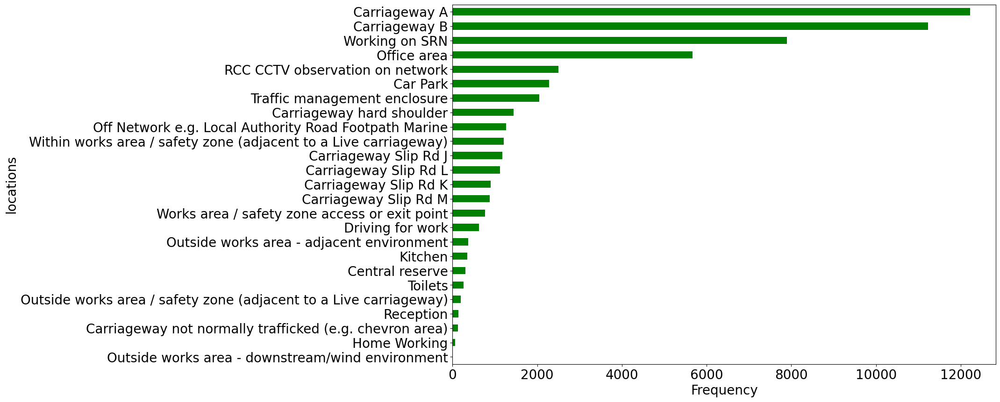

In [36]:
eventlocplot.plot(kind='barh', fontsize= 20, color='green')
plt.xlabel('Frequency', fontsize= 20)
plt.ylabel('locations', fontsize= 20)

The top 5 locations with incidents happening include; Carriageway A, Carriageway B, Working on SRN, Office area and  RCC CCTV observation on network.

In [37]:
df.describe()

,PublishedRecordId,Time into Shift,Experience in Current Role,Age Range,Potential Severity Rating,Actual Severity Rating,month,Frequency
count,64912.000000,7182.000000,64912.000000,64912.000000,64912.000000,64912.000000,64912.000000,0.0
mean,52329.704631,-12.520670,11.991450,38.535032,12.417319,12.384428,6.542750,NaN
std,32693.499720,523.468169,6.657656,12.089580,6.881501,2.948331,3.444392,NaN
min,8056.000000,-35061.000000,1.000000,18.000000,1.000000,1.000000,1.000000,NaN
25%,28633.750000,1.500000,6.000000,28.000000,7.000000,12.000000,3.000000,NaN
50%,45033.500000,3.233333,12.000000,39.000000,12.000000,12.000000,7.000000,NaN
75%,62399.250000,5.500000,18.000000,49.000000,18.000000,12.000000,10.000000,NaN
max,131601.000000,8796.083333,23.000000,59.000000,25.000000,25.000000,12.000000,NaN


In [38]:
df=df.drop(columns=['time2','time1','Time into Shift'])

# Data cleaning

Drop columns with over 50% missing values

In [39]:
df. info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64912 entries, 0 to 64911
Data columns (total 23 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   PublishedRecordId                 64912 non-null  int64         
 1   Region                            64912 non-null  object        
 2   Site/Project                      64912 non-null  object        
 3   Event Type                        64912 non-null  object        
 4   Date and Time of Event            64912 non-null  datetime64[ns]
 5   vehicles involved?                62956 non-null  object        
 6   Type of Person                    64911 non-null  object        
 7   Location                          55046 non-null  object        
 8   Shift Start Date and Time         7182 non-null   datetime64[ns]
 9   Did this event occur on the SRN?  6634 non-null   object        
 10  Type of road works                489 non-null

replace null values in part of body affected and injury type with column value 'not applicable' because those kind of events do not affect body parts or cause injury

In [40]:
df['Part of Body Affected'] = df['Part of Body Affected'].fillna('Not applicable')
df['Injury Type'] = df['Injury Type'].fillna('Not applicable')

In [41]:
df['Weather / Visibility']=df['Weather / Visibility'].fillna('Not applicable')

In [42]:
df.isnull().sum()

PublishedRecordId                       0
Region                                  0
Site/Project                            0
Event Type                              0
Date and Time of Event                  0
vehicles involved?                   1956
Type of Person                          1
Location                             9866
Shift Start Date and Time           57730
Did this event occur on the SRN?    58278
Type of road works                  64423
Type of traffic management          64571
Part of Body Affected                   0
Injury Type                             0
Experience in Current Role              0
Age Range                               0
Weather / Visibility                    0
Potential Severity Rating               0
Actual Severity Rating                  0
Structural safety risk scores           0
month                                   0
Season                                  0
Frequency                           64912
dtype: int64

In [43]:
df.duplicated().sum()

0

In [44]:
df.columns

Index(['PublishedRecordId', 'Region', 'Site/Project', 'Event Type',
       'Date and Time of Event', 'vehicles involved?', 'Type of Person',
       'Location', 'Shift Start Date and Time',
       'Did this event occur on the SRN?', 'Type of road works',
       'Type of traffic management', 'Part of Body Affected', 'Injury Type',
       'Experience in Current Role', 'Age Range', 'Weather / Visibility',
       'Potential Severity Rating', 'Actual Severity Rating',
       'Structural safety risk scores', 'month', 'Season', 'Frequency'],
      dtype='object')

where the Location was 'working on SRN', the column 'Did this event occur on the SRN?' was populated with Yes

In [45]:
conditions=[(df['Location']=='Working on SRN')]

Values= ['Yes']

df['Did this event occur on the SRN?'] = np.select(conditions, Values)

In [46]:
df.loc[(df['Location'] =='Working on SRN')]

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,vehicles involved?,Type of Person,Location,Shift Start Date and Time,Did this event occur on the SRN?,...,Injury Type,Experience in Current Role,Age Range,Weather / Visibility,Potential Severity Rating,Actual Severity Rating,Structural safety risk scores,month,Season,Frequency
38,131563,West Midlands - NH Offices & Depots,Bescot Depot,Personal illness or injury,2022-08-09 09:30:00,False,Employee,Working on SRN,2022-08-09 09:30:00,Yes,...,Strain / sprain,13,52,Not applicable,25,25,***REDACTED***,8,Summer,NaN
39,131562,North West - Operations,AD - Construction - Ten,Incursion / IPV Strike,2022-08-04 22:48:00,NaN,Contractor,Working on SRN,NaT,Yes,...,Not applicable,13,58,Not applicable,21,2,***REDACTED***,8,Summer,NaN
109,131495,North West - Major Projects,MP-0164 - M6 J21A to 26 - SMA,Incursion / IPV Strike,2022-08-06 07:14:00,True,Contractor,Working on SRN,NaT,Yes,...,Not applicable,18,53,Not applicable,20,22,***REDACTED***,8,Summer,NaN
123,131482,North West - Outstations & ROCs,Milnrow Outstation,Undesired Circumstance / Near Miss,2022-08-07 12:00:00,False,Employee,Working on SRN,2022-08-07 08:00:00,Yes,...,Not applicable,10,34,Not applicable,6,12,***REDACTED***,8,Summer,NaN
195,131411,West Midlands - Outstations & ROCs,Hilton Park Outstation,Undesired Circumstance / Near Miss,2022-08-04 14:00:00,False,Employee,Working on SRN,2022-08-04 06:00:00,Yes,...,Not applicable,13,31,Not applicable,8,12,***REDACTED***,8,Summer,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55511,21803,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2019-06-29 07:27:00,False,Employee,Working on SRN,NaT,Yes,...,Not applicable,4,23,Not applicable,16,12,***REDACTED***,6,Summer,NaN
55692,21622,East Midlands - NH Offices & Depots,Stirling House,Undesired Circumstance / Near Miss,2019-03-20 15:30:00,False,Employee,Working on SRN,NaT,Yes,...,Not applicable,8,54,Not applicable,15,12,***REDACTED***,3,Spring,NaN
56085,21229,East - Major Projects,MP-0000 - OD East M11 Essex Package,Personal illness or injury,2019-06-25 13:40:00,False,Employee,Working on SRN,NaT,Yes,...,Strain / sprain,14,45,Not applicable,25,25,***REDACTED***,6,Summer,NaN
56709,20605,East - Outstations & ROCs,Heston East Outstation,Undesired Circumstance / Near Miss,2019-06-30 10:45:00,False,Employee,Working on SRN,NaT,Yes,...,Not applicable,19,23,Not applicable,10,12,***REDACTED***,6,Summer,NaN


In [47]:
df['Did this event occur on the SRN?'].unique()

array(['0', 'Yes'], dtype=object)

In [48]:
# 'type of person' only had one null value so that row was located 
df[df['Type of Person'].isna()]

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,vehicles involved?,Type of Person,Location,Shift Start Date and Time,Did this event occur on the SRN?,...,Injury Type,Experience in Current Role,Age Range,Weather / Visibility,Potential Severity Rating,Actual Severity Rating,Structural safety risk scores,month,Season,Frequency
7243,124672,South East - Outstations & ROCs,Dartford South East Outstation,Undesired Circumstance / Near Miss,2022-02-04 18:00:00,False,NaN,Office area,2022-02-04 14:00:00,0,...,Not applicable,2,18,Not applicable,21,12,***REDACTED***,2,Winter,NaN


In [49]:
#from the location off the event that happened which is the office area, the type of person is more likely to be an employee 
df['Type of Person']=df['Type of Person'].fillna('Employee')

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64912 entries, 0 to 64911
Data columns (total 23 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   PublishedRecordId                 64912 non-null  int64         
 1   Region                            64912 non-null  object        
 2   Site/Project                      64912 non-null  object        
 3   Event Type                        64912 non-null  object        
 4   Date and Time of Event            64912 non-null  datetime64[ns]
 5   vehicles involved?                62956 non-null  object        
 6   Type of Person                    64912 non-null  object        
 7   Location                          55046 non-null  object        
 8   Shift Start Date and Time         7182 non-null   datetime64[ns]
 9   Did this event occur on the SRN?  64912 non-null  object        
 10  Type of road works                489 non-null

In [51]:
#drop the columns with less than 50% of the data available
df=df.drop(columns=['Structural safety risk scores','Frequency','Shift Start Date and Time','Type of road works','Type of traffic management'])

In [52]:
df[df['Location'].isna()]

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,vehicles involved?,Type of Person,Location,Did this event occur on the SRN?,Part of Body Affected,Injury Type,Experience in Current Role,Age Range,Weather / Visibility,Potential Severity Rating,Actual Severity Rating,month,Season
3,131598,North West - Outstations & ROCs,Milness Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:10:00,False,Employee,NaN,0,Not applicable,Not applicable,4,36,Not applicable,2,12,8,Summer
5,131596,North West - Outstations & ROCs,Milness Outstation,Undesired Circumstance / Near Miss,2022-08-09 16:00:00,False,Employee,NaN,0,Not applicable,Not applicable,1,54,Not applicable,8,12,8,Summer
6,131595,East - Operations,Area 6 & 8,Incursion / IPV Strike,2022-08-09 01:00:00,NaN,Contractor,NaN,0,Not applicable,Not applicable,22,38,Not applicable,1,1,8,Summer
11,131590,South East - Operations,Area 4,Undesired Circumstance / Near Miss,2022-08-08 21:35:00,NaN,Employee,NaN,0,Not applicable,Not applicable,16,42,Not applicable,15,12,8,Summer
12,131589,South East - Operations,Area 4,Undesired Circumstance / Near Miss,2022-08-08 21:20:00,NaN,Employee,NaN,0,Not applicable,Not applicable,11,37,Not applicable,15,12,8,Summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64886,8114,North West - Outstations & ROCs,Newton-Le-Willows ROC,Undesired Circumstance / Near Miss,2018-11-04 04:39:00,False,Employee,NaN,0,Not applicable,Not applicable,17,47,Not applicable,9,12,11,Autumn
64887,8113,North West - Outstations & ROCs,Newton-Le-Willows ROC,Undesired Circumstance / Near Miss,2018-10-05 23:30:00,False,Employee,NaN,0,Not applicable,Not applicable,23,18,Not applicable,23,12,10,Autumn
64889,8097,North West - Outstations & ROCs,Knutsford Outstation,Infrastructure / Asset,2018-08-12 12:15:00,False,Employee,NaN,0,Not applicable,Not applicable,4,49,Not applicable,2,19,8,Summer
64898,8078,South West - Operations,Area 1 & 2,Undesired Circumstance / Near Miss,2018-10-16 10:00:00,False,Employee,NaN,0,Not applicable,Not applicable,21,57,Not applicable,11,12,10,Autumn


In [53]:
NationalMajorProjects=df.loc[df['Region']=='National - Major Projects']

In [54]:
df.loc[df['Event Type']=='Incursion / IPV Strike', 'vehicles involved?']='True'
df.loc[df['Event Type']=='Undesired Circumstance / Near Miss', 'vehicles involved?']='False'
df.loc[df['Event Type']=='Infrastructure / Asset', 'vehicles involved?']='False'
df.loc[df['Event Type']=='Facilities / Site', 'vehicles involved?']='False'
#df.loc[df['Event Type']=='Environmental', 'vehicles involved?']='False'
df.loc[df['Event Type']=='Personal injury', 'vehicles involved?']='False'

In [55]:
df['Location'].fillna('Not available')

0                                    Carriageway Slip Rd K
1                                            Carriageway B
2                                    Carriageway Slip Rd J
3                                            Not available
4        Off Network e.g. Local Authority Road Footpath...
                               ...                        
64907                                        Carriageway B
64908                                        Carriageway A
64909                                        Carriageway A
64910                                        Not available
64911    Off Network e.g. Local Authority Road Footpath...
Name: Location, Length: 64912, dtype: object

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64912 entries, 0 to 64911
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   PublishedRecordId                 64912 non-null  int64         
 1   Region                            64912 non-null  object        
 2   Site/Project                      64912 non-null  object        
 3   Event Type                        64912 non-null  object        
 4   Date and Time of Event            64912 non-null  datetime64[ns]
 5   vehicles involved?                64858 non-null  object        
 6   Type of Person                    64912 non-null  object        
 7   Location                          55046 non-null  object        
 8   Did this event occur on the SRN?  64912 non-null  object        
 9   Part of Body Affected             64912 non-null  object        
 10  Injury Type                       64912 non-nu

In [57]:
df.isnull().sum()

PublishedRecordId                      0
Region                                 0
Site/Project                           0
Event Type                             0
Date and Time of Event                 0
vehicles involved?                    54
Type of Person                         0
Location                            9866
Did this event occur on the SRN?       0
Part of Body Affected                  0
Injury Type                            0
Experience in Current Role             0
Age Range                              0
Weather / Visibility                   0
Potential Severity Rating              0
Actual Severity Rating                 0
month                                  0
Season                                 0
dtype: int64

In [58]:
df.loc[df['vehicles involved?'].isna()]

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,vehicles involved?,Type of Person,Location,Did this event occur on the SRN?,Part of Body Affected,Injury Type,Experience in Current Role,Age Range,Weather / Visibility,Potential Severity Rating,Actual Severity Rating,month,Season
14,131587,South East - Operations,Area 4,Environmental,2022-08-08 21:25:00,NaN,Employee,NaN,0,Not applicable,Not applicable,13,42,Not applicable,22,3,8,Summer
601,131021,North West - Operations,Area 10,Environmental,2022-07-26 10:00:00,NaN,Employee,Working on SRN,Yes,Not applicable,Not applicable,15,44,Not applicable,9,13,7,Summer
777,130845,North West - Operations,AD - Construction - Ten,Security,2022-07-21 09:00:00,NaN,Employee,Off Network e.g. Local Authority Road Footpath...,0,Not applicable,Not applicable,16,54,Not applicable,1,2,7,Summer
811,130811,North West - Operations,AD - Construction - Ten,Personal illness or injury,2022-07-20 09:30:00,NaN,Employee,Off Network e.g. Local Authority Road Footpath...,0,Not applicable,Not applicable,7,38,Not applicable,25,25,7,Summer
902,130728,Midlands - Operations,AD - M&R - Seven,Personal illness or injury,2022-07-15 15:00:00,NaN,Contractor,NaN,0,Chest/Stomach,Other,4,53,Not applicable,25,25,7,Summer
1161,130479,South East - Operations,Area 4,Environmental,2022-07-07 19:30:00,NaN,Employee,NaN,0,Not applicable,Not applicable,1,23,Not applicable,2,1,7,Summer
1264,130384,South East - Operations,Area 4,Environmental,2022-07-06 20:30:00,NaN,Employee,NaN,0,Not applicable,Not applicable,2,55,Not applicable,12,7,7,Summer
1274,130373,South East - Outstations & ROCs,Dartford South East Outstation,Personal illness or injury,2022-07-07 10:30:00,NaN,Employee,Car Park,0,"Finger/Thumb, Head","Swelling / Oedema, Bruising, Cut / laceration",8,31,Not applicable,25,25,7,Summer
1275,130372,South East - Major Projects,MP-0267 - A31 Ringwood Improvements,Personal illness or injury,2022-06-16 19:30:00,NaN,Employee,NaN,0,Hip,Fracture,22,36,Not applicable,25,25,6,Summer
1369,130283,North West - Operations,Area 10,Environmental,2022-07-05 09:30:00,NaN,Employee,Working on SRN,Yes,Not applicable,Not applicable,10,32,Not applicable,15,23,7,Summer


In [59]:
df.loc[df['Type of Person']=='Employee', 'Type_of_work']='Traffic management/control'
df.loc[df['Type of Person']=='Contractor', 'Type_of_work']='Highway construction work'
df.loc[df['Type of Person']=='Member of the Public', 'Type_of_work']='Not applicable'
df.loc[df['Type of Person']=='Customer', 'Type_of_work']='Not applicable'
#df.loc[df['Event Type']=='Incursion / IPV Strike', 'vehicles involved?']='True'

In [60]:
df['Type of Person'].unique()

array(['Employee', 'Contractor', 'Member of the Public', 'Customer'],
      dtype=object)

In [61]:
df.loc[df['Event Type']=='Utility Strike']

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,vehicles involved?,Type of Person,Location,Did this event occur on the SRN?,Part of Body Affected,Injury Type,Experience in Current Role,Age Range,Weather / Visibility,Potential Severity Rating,Actual Severity Rating,month,Season,Type_of_work
312,131296,East - Major Projects,MP-0156 - M4 J3 to12 Smart Motorway,Utility Strike,2022-07-09 01:48:00,True,Employee,NaN,0,Not applicable,Not applicable,21,47,Not applicable,4,22,7,Summer,Traffic management/control
340,131268,Yorkshire & North East - Major Projects,MP-0116 - A63 Castle Street - RIP,Utility Strike,2022-08-01 14:20:00,False,Contractor,Within works area / safety zone (adjacent to a...,0,Not applicable,Not applicable,10,37,Not applicable,9,9,8,Summer,Highway construction work
713,130908,Yorkshire & North East - Major Projects,MP-0116 - A63 Castle Street - RIP,Utility Strike,2022-07-22 11:25:00,False,Contractor,Outside works area / safety zone (adjacent to ...,0,Not applicable,Not applicable,6,42,Not applicable,15,16,7,Summer,Highway construction work
716,130905,South West - Major Projects,MP-0253 - A30 Chiverton to Carland Cross - RDP,Utility Strike,2022-07-22 12:00:00,False,Contractor,Off Network e.g. Local Authority Road Footpath...,0,Not applicable,Not applicable,8,54,Not applicable,5,9,7,Summer,Highway construction work
812,130810,South East - Major Projects,MP-0267 - A31 Ringwood,Utility Strike,2022-07-19 15:30:00,False,Contractor,NaN,0,Not applicable,Not applicable,23,23,Not applicable,2,17,7,Summer,Highway construction work
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63956,12731,South East - Major Projects,MP-0169 - M27 J4 to 11,Utility Strike,2018-09-06 01:30:00,False,Employee,Carriageway A,0,Not applicable,Not applicable,16,42,Not applicable,23,3,9,Autumn,Traffic management/control
63959,12728,South East - Major Projects,MP-0165 - M20 J3 to 5,Utility Strike,2018-09-06 09:00:00,False,Employee,Carriageway B,0,Not applicable,Not applicable,4,51,Not applicable,14,11,9,Autumn,Traffic management/control
64015,12672,South West - Operations,Area 1 & 2,Utility Strike,2018-09-04 16:00:00,False,Employee,Within works area / safety zone (adjacent to a...,0,Not applicable,Not applicable,11,27,Not applicable,4,23,9,Autumn,Traffic management/control
64053,12634,Midlands - Major Projects,MP-0150 - M1 J23A to J25,Utility Strike,2018-09-03 13:30:00,False,Employee,Within works area / safety zone (adjacent to a...,0,Not applicable,Not applicable,16,38,Not applicable,7,2,9,Autumn,Traffic management/control


In [62]:
df['Year']= pd.DatetimeIndex(df['Date and Time of Event']).year

# Events per year

In [63]:
events_per_year= df.groupby(['Year'], as_index=False)['Event Type'].count()
events_per_year

,Year,Event Type
0,2018,5411
1,2019,14368
2,2020,16294
3,2021,20111
4,2022,8728


Text(0, 0.5, 'Number of events')

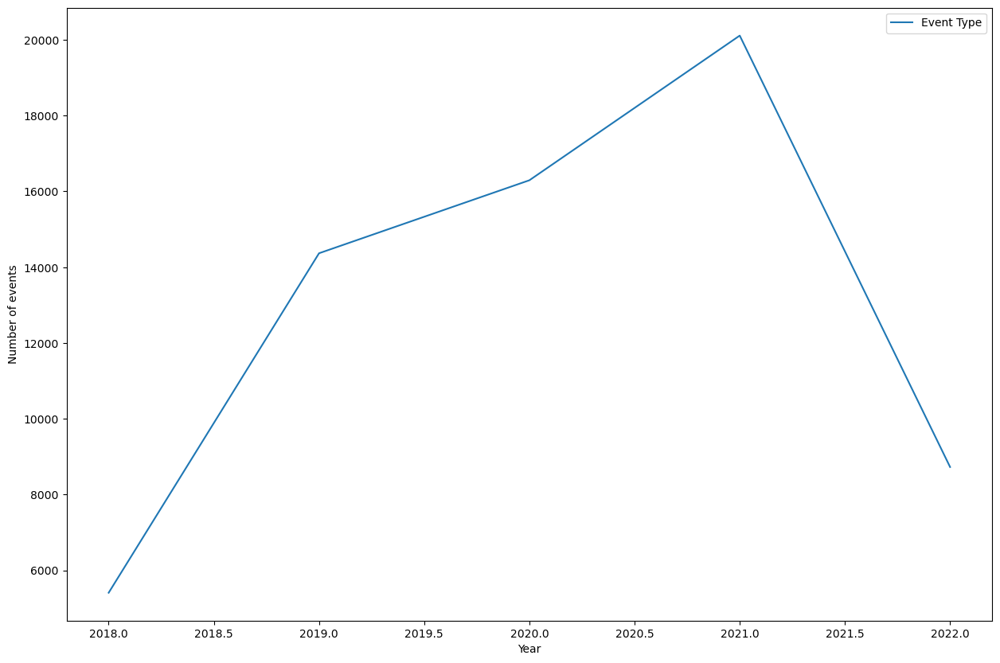

In [64]:
events_per_year.plot(x='Year',y='Event Type')
plt.ylabel('Number of events')

# Injury occurrence column

In [65]:
df.loc[df['Event Type']=='Personal illness or injury','Injury occurrence']='Yes'
df['Injury occurrence']= df['Injury occurrence'].fillna('No')

In [66]:
injury_by_season= df.groupby(['Season'], as_index=False)['Injury occurrence'].count()

# injuries per year

In [67]:
personal_injuries_per_year = df[df['Event Type'] == 'Personal illness or injury'].groupby(['Year'], as_index = False)['Injury occurrence'].count()
personal_injuries_per_year 

,Year,Injury occurrence
0,2018,268
1,2019,608
2,2020,454
3,2021,410
4,2022,224


Text(0, 0.5, 'Number of injuries')

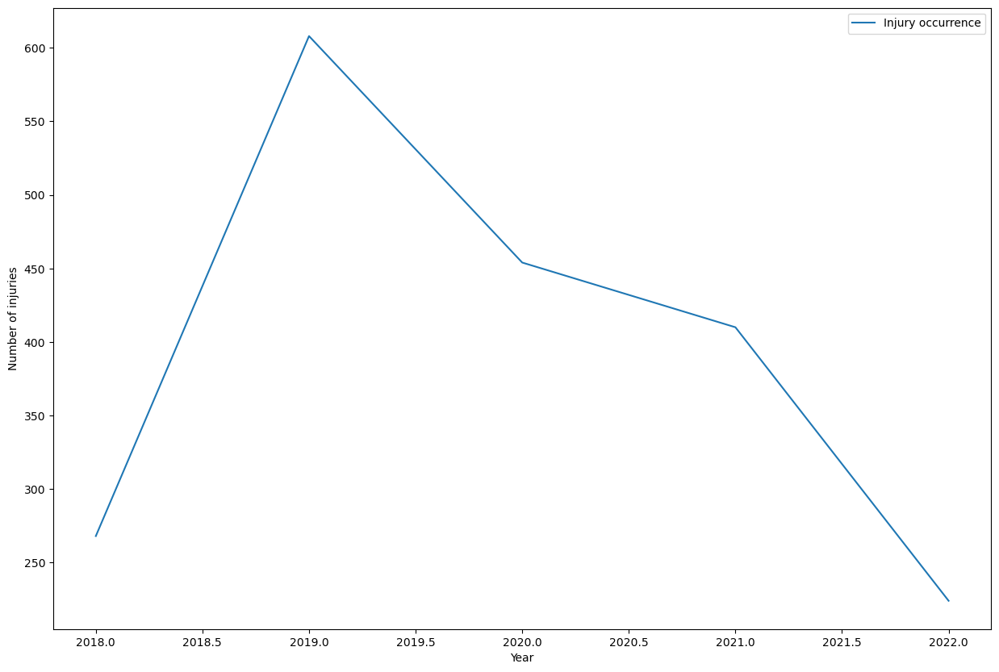

In [68]:
personal_injuries_per_year.plot(x='Year',y='Injury occurrence')
plt.ylabel('Number of injuries')

In [69]:
tab=pd.merge(events_per_year, personal_injuries_per_year, on='Year') #ignore_index=True, sort=False)
tab

,Year,Event Type,Injury occurrence
0,2018,5411,268
1,2019,14368,608
2,2020,16294,454
3,2021,20111,410
4,2022,8728,224


,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,vehicles involved?,Type of Person,Location,Did this event occur on the SRN?,Part of Body Affected,...,Experience in Current Role,Age Range,Weather / Visibility,Potential Severity Rating,Actual Severity Rating,month,Season,Type_of_work,Year,Injury occurrence
0,131601,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 18:20:00,False,Employee,Carriageway Slip Rd K,0,Not applicable,...,22,28,Not applicable,1,12,8,Summer,Traffic management/control,2022,No
1,131600,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:00:00,False,Employee,Carriageway B,0,Not applicable,...,17,45,Not applicable,8,12,8,Summer,Traffic management/control,2022,No
2,131599,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-08 20:14:00,False,Employee,Carriageway Slip Rd J,0,Not applicable,...,10,20,Not applicable,18,12,8,Summer,Traffic management/control,2022,No
3,131598,North West - Outstations & ROCs,Milness Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:10:00,False,Employee,NaN,0,Not applicable,...,4,36,Not applicable,2,12,8,Summer,Traffic management/control,2022,No
5,131596,North West - Outstations & ROCs,Milness Outstation,Undesired Circumstance / Near Miss,2022-08-09 16:00:00,False,Employee,NaN,0,Not applicable,...,1,54,Not applicable,8,12,8,Summer,Traffic management/control,2022,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64907,8062,South West - Outstations & ROCs,Pridhamsleigh Outstation,Undesired Circumstance / Near Miss,2018-10-08 06:20:00,False,Employee,Carriageway B,0,Not applicable,...,17,33,Not applicable,15,12,10,Autumn,Traffic management/control,2018,No
64908,8061,South West - Outstations & ROCs,Pridhamsleigh Outstation,Undesired Circumstance / Near Miss,2018-09-22 09:30:00,False,Employee,Carriageway A,0,Not applicable,...,22,48,Not applicable,15,12,9,Autumn,Traffic management/control,2018,No
64909,8060,South West - Outstations & ROCs,Stanton St Quinton Outstation,Undesired Circumstance / Near Miss,2018-09-18 22:54:00,False,Employee,Carriageway A,0,Not applicable,...,18,54,Not applicable,1,12,9,Autumn,Traffic management/control,2018,No
64910,8059,East - Outstations & ROCs,South Mimms ROC,Undesired Circumstance / Near Miss,2018-10-02 03:50:00,False,Employee,NaN,0,Not applicable,...,19,45,Not applicable,10,12,10,Autumn,Traffic management/control,2018,No


# project risk level

In [72]:
condi=[(df['Actual Severity Rating']<10), (df['Actual Severity Rating']>=10) & (df['Actual Severity Rating']<20), (df['Actual Severity Rating']>=20) & (df['Actual Severity Rating']<26)
           , df['Event Type']=='Personal illness or injury']

Val= ['low', 'medium','High','High']

df['Project risk level'] = np.select(condi, Val)

In [73]:
df['Project risk level'].unique()

array(['medium', 'low', 'High'], dtype=object)

# Season with the most incident events

In [74]:
event_by_season= df.groupby(['Season'], as_index=False)['Event Type'].count()
event_by_season

,Season,Event Type
0,Autumn,17231
1,Spring,14969
2,Summer,16920
3,Winter,15792


Text(0, 0.5, 'Frequency')

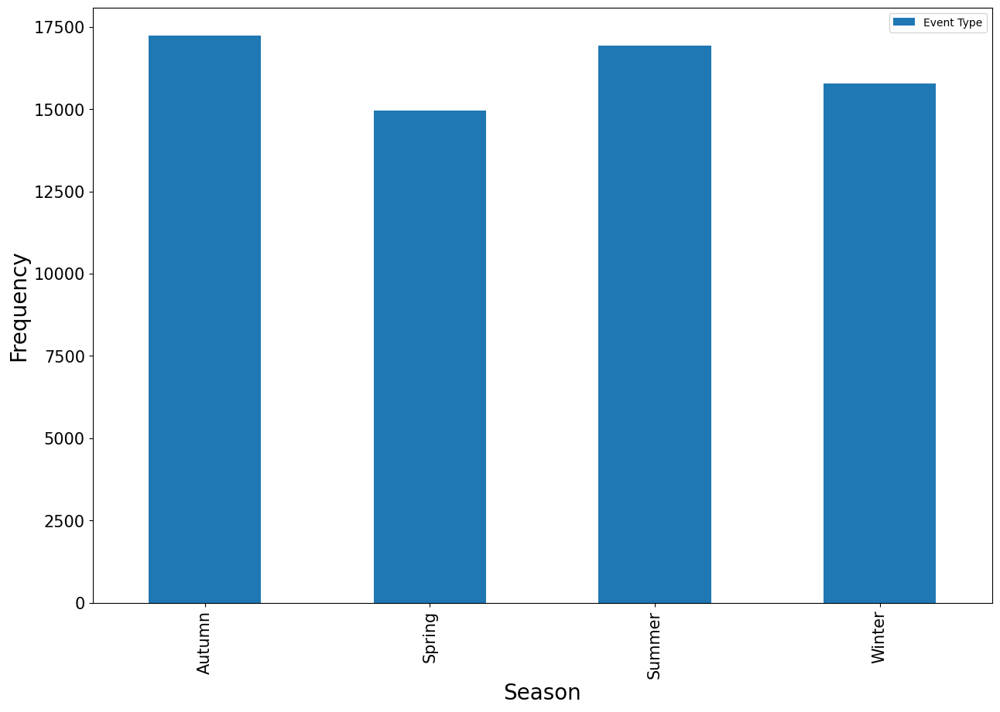

In [75]:
event_by_season.plot(x='Season', y= 'Event Type', kind='bar', fontsize=15)
plt.xlabel('Season', fontsize=20)
plt.ylabel('Frequency', fontsize=20)

Autumn has the most events, followed by summer, then winter and spring

# Day of the week

In [76]:
df['day_of_week'] = df['Date and Time of Event'].dt.day_name()

# finding time of day (morning, afternoon, evening or night)

In [77]:
df['time']=pd.DatetimeIndex(df['Date and Time of Event']).hour

In [78]:
cond=[(df['time']>=7)&(df['time']<12), (df['time']>=12) & (df['time']<16), (df['time']>=16) & (df['time']<20), 
      (df['time']>=20)&(df['time']<=23)
           ]

Vals= ['Morning', 'Afternoon','Evening','Night']

df['time_of_day'] = np.select(cond, Vals)

In [79]:
df.head(3)

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,vehicles involved?,Type of Person,Location,Did this event occur on the SRN?,Part of Body Affected,...,Actual Severity Rating,month,Season,Type_of_work,Year,Injury occurrence,Project risk level,day_of_week,time,time_of_day
0,131601,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 18:20:00,False,Employee,Carriageway Slip Rd K,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Tuesday,18,Evening
1,131600,East - Outstations & ROCs,South Mimms Outstation,Undesired Circumstance / Near Miss,2022-08-09 17:00:00,False,Employee,Carriageway B,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Tuesday,17,Evening
2,131599,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-08 20:14:00,False,Employee,Carriageway Slip Rd J,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Monday,20,Night


# which day has the most incident event happening

In [80]:
event_by_day= df.groupby(['day_of_week'], as_index=False)['Event Type'].count()
event_by_day

,day_of_week,Event Type
0,Friday,9572
1,Monday,9940
2,Saturday,6416
3,Sunday,5900
4,Thursday,10719
5,Tuesday,11182
6,Wednesday,11183


Text(0.5, 0, 'Day of week')

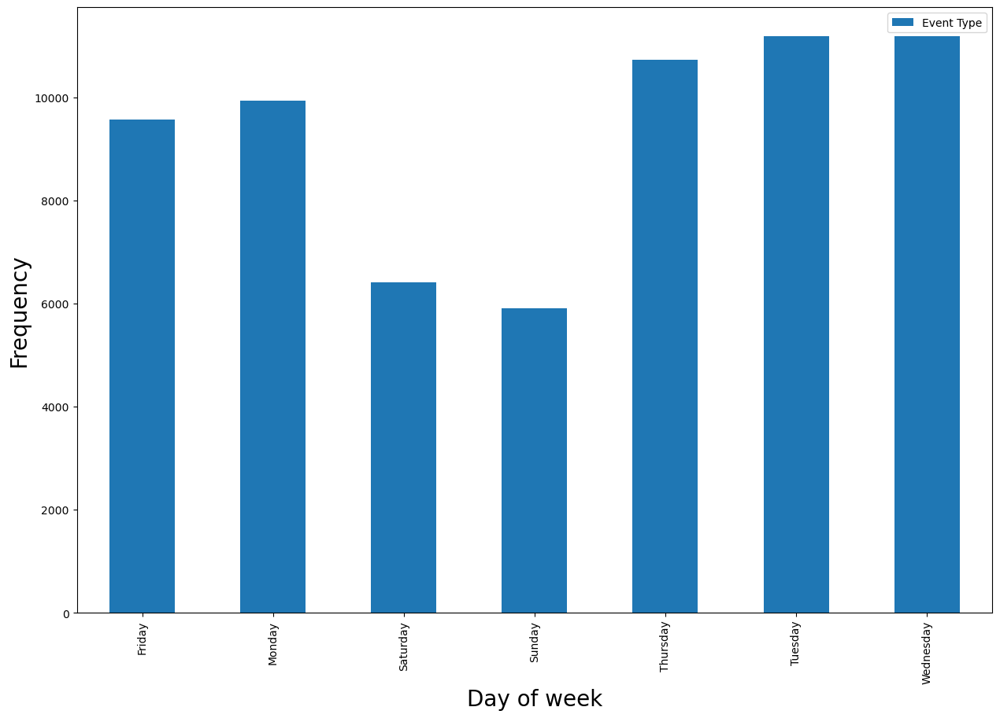

In [81]:

event_by_day.plot(x='day_of_week', y= 'Event Type', kind='bar')
plt.ylabel('Frequency', fontsize=20)
plt.xlabel('Day of week', fontsize=20)

In [82]:
df.columns

Index(['PublishedRecordId', 'Region', 'Site/Project', 'Event Type',
       'Date and Time of Event', 'vehicles involved?', 'Type of Person',
       'Location', 'Did this event occur on the SRN?', 'Part of Body Affected',
       'Injury Type', 'Experience in Current Role', 'Age Range',
       'Weather / Visibility', 'Potential Severity Rating',
       'Actual Severity Rating', 'month', 'Season', 'Type_of_work', 'Year',
       'Injury occurrence', 'Project risk level', 'day_of_week', 'time',
       'time_of_day'],
      dtype='object')

# Injuries per day

In [83]:
personal_injuries_per_day = df[df['Event Type'] == 'Personal illness or injury'].groupby(['day_of_week'], as_index = False)['Event Type'].count()
personal_injuries_per_day 

,day_of_week,Event Type
0,Friday,253
1,Monday,326
2,Saturday,152
3,Sunday,144
4,Thursday,357
5,Tuesday,378
6,Wednesday,354


Text(0.5, 0, 'Day of week')

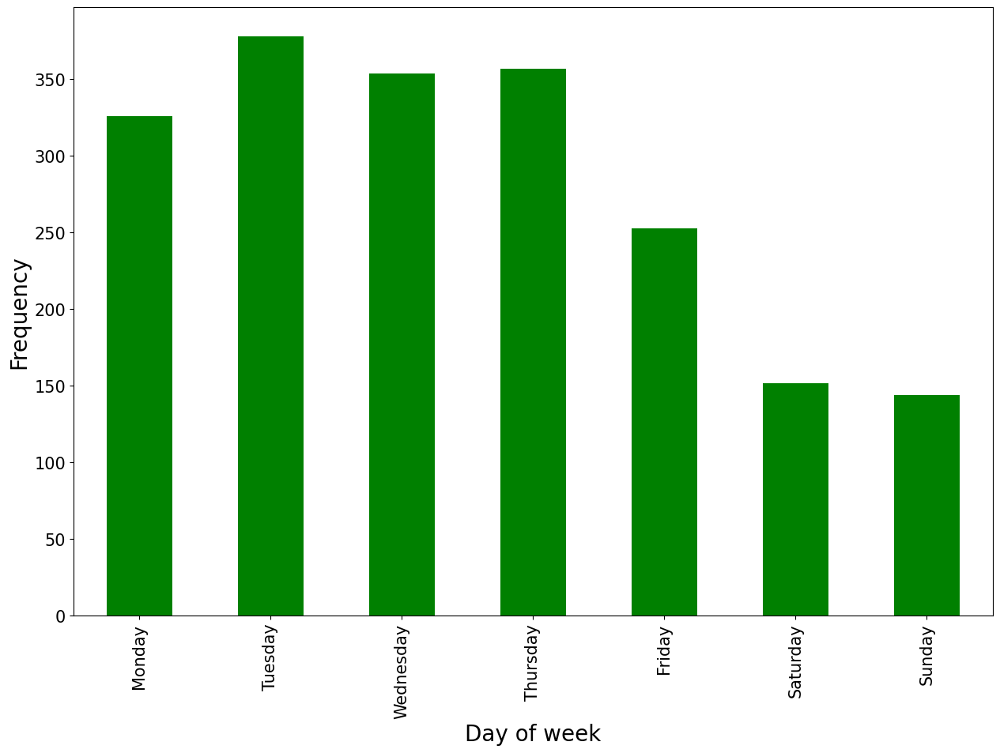

In [84]:
field = "day_of_week"
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
ax = personal_injuries_per_day.set_index(field).loc[day_order].plot(kind="bar", legend=False, fontsize=15, color='green')
ax.set_ylabel("Frequency", fontsize=20)
ax.set_xlabel("Day of week", fontsize=20)


#personal_injuries_per_day.plot(x='day_of_week', y= 'Event Type', kind='bar')
#plt.ylabel('Frequency')

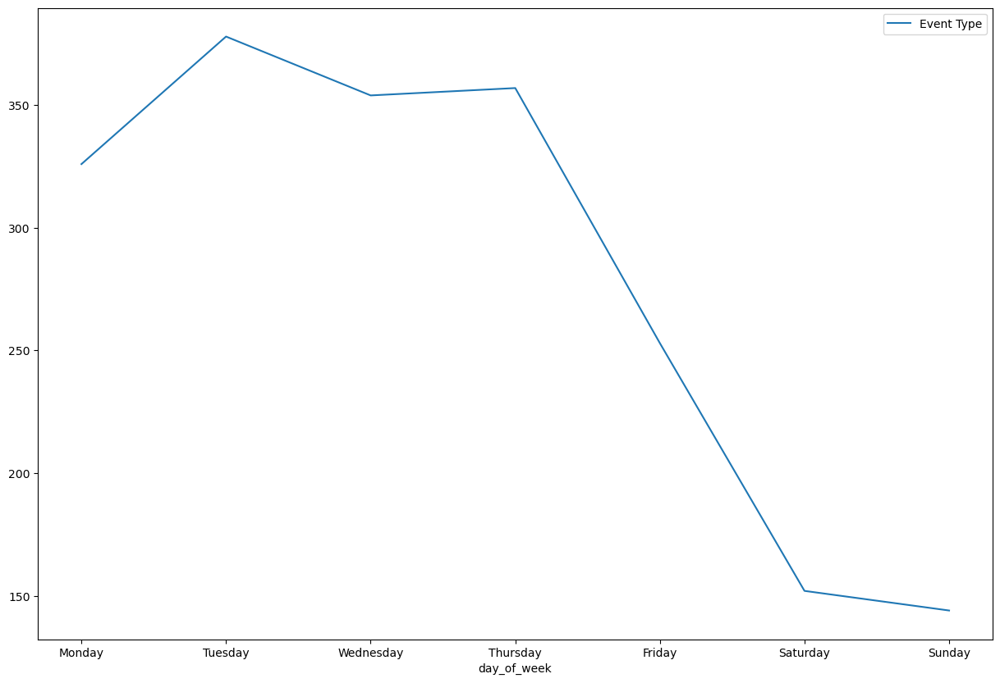

In [85]:
field = "day_of_week"
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
ax = personal_injuries_per_day.set_index(field).loc[day_order].plot()

In [86]:
project_event_risk = df.groupby(['Project risk level'], as_index=False)['Event Type'].count()
project_event_risk

,Project risk level,Event Type
0,High,2924
1,low,2175
2,medium,59813


# injury distribution by body part

In [87]:
injury_by_body_part= df.groupby(['Part of Body Affected'], as_index=False)['Injury Type'].count()
ij=injury_by_body_part.sort_values(by=['Injury Type'], ascending=False)
ij.head(20)

,Part of Body Affected,Injury Type
126,Not applicable,62979
0,Ankle/Foot,195
15,Finger/Thumb,193
1,Back/Spine,154
59,Leg,150
89,Mental/Psychological,146
20,Hand,130
30,Head,123
46,Knee,114
4,Chest/Stomach,71


(1.0, 500.0)

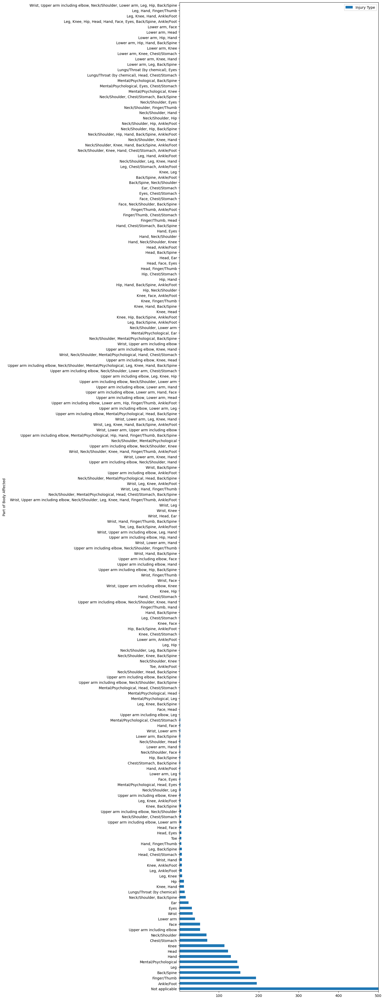

In [88]:
#k=df['Injury Type'].value_counts()
bx=ij.plot(x='Part of Body Affected',y= 'Injury Type', kind='barh', figsize=(10,50))
plt.xlim(1,500)
#[bx.text('{:.2f}%'.format(100*182/1933))]

In [89]:
BP= df['Part of Body Affected'].value_counts()
BP.head(20)

Not applicable                62979
Ankle/Foot                      195
Finger/Thumb                    193
Back/Spine                      154
Leg                             150
Mental/Psychological            146
Hand                            130
Head                            123
Knee                            114
Chest/Stomach                    71
Neck/Shoulder                    69
Face                             53
Upper arm including elbow        53
Lower arm                        40
Wrist                            34
Eyes                             32
Ear                              24
Neck/Shoulder, Back/Spine        17
Lungs/Throat (by chemical)       14
Knee, Hand                       12
Name: Part of Body Affected, dtype: int64

Text(0, 0.5, 'Body part')

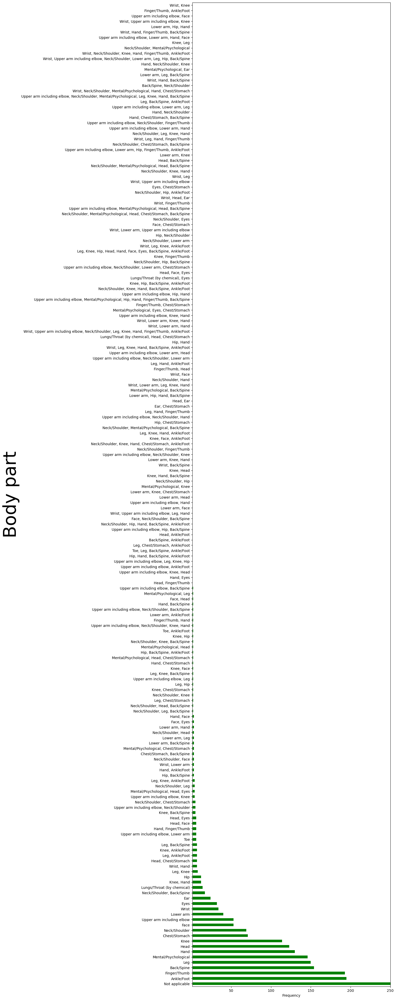

In [90]:
bx= BP.plot(kind='barh', figsize=(10,50), color='green')
plt.xlim(1,250)
plt.xlabel('Frequency')
plt.ylabel('Body part', fontsize= 50)

In [91]:
df['Event Type'].value_counts()

Undesired Circumstance / Near Miss    57515
Personal illness or injury             1964
Infrastructure / Asset                 1733
Incursion / IPV Strike                 1219
Facilities / Site                       808
Environmental                           530
Structural Safety                       406
Security                                406
Utility Strike                          331
Name: Event Type, dtype: int64

In [92]:
df.describe()

,PublishedRecordId,Experience in Current Role,Age Range,Potential Severity Rating,Actual Severity Rating,month,Year,time
count,64912.000000,64912.000000,64912.000000,64912.000000,64912.000000,64912.000000,64912.000000,64912.000000
mean,52329.704631,11.991450,38.535032,12.417319,12.384428,6.542750,2020.190674,12.671863
std,32693.499720,6.657656,12.089580,6.881501,2.948331,3.444392,1.168804,6.394746
min,8056.000000,1.000000,18.000000,1.000000,1.000000,1.000000,2018.000000,0.000000
25%,28633.750000,6.000000,28.000000,7.000000,12.000000,3.000000,2019.000000,8.000000
50%,45033.500000,12.000000,39.000000,12.000000,12.000000,7.000000,2020.000000,13.000000
75%,62399.250000,18.000000,49.000000,18.000000,12.000000,10.000000,2021.000000,18.000000
max,131601.000000,23.000000,59.000000,25.000000,25.000000,12.000000,2022.000000,23.000000


In [93]:
df1= df[(df.Year!=2022)&(df.Year!=2021)]

In [94]:
personal_injuries_per_day1 = df1[df['Injury occurrence'] == 'Yes'].groupby(['day_of_week'], as_index = False)['Injury occurrence'].count()
personal_injuries_per_day1 

C:\Users\44742\AppData\Local\Temp\ipykernel_8584\2323890145.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  personal_injuries_per_day1 = df1[df['Injury occurrence'] == 'Yes'].groupby(['day_of_week'], as_index = False)['Injury occurrence'].count()


,day_of_week,Injury occurrence
0,Friday,168
1,Monday,231
2,Saturday,99
3,Sunday,95
4,Thursday,239
5,Tuesday,256
6,Wednesday,242


<AxesSubplot:xlabel='day_of_week'>

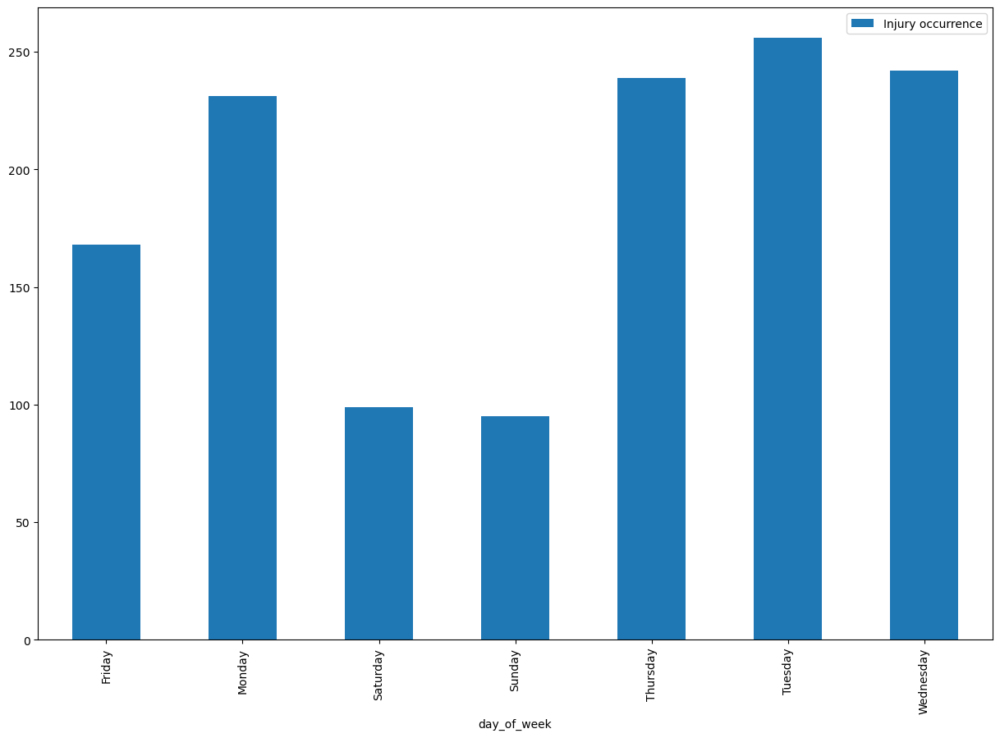

In [95]:
personal_injuries_per_day1.plot(kind='bar', x='day_of_week', y='Injury occurrence')

In [96]:
personal_injuries_per_month = df[df['Injury occurrence'] == 'Yes'].groupby(['month'], as_index = False)['Injury occurrence'].count()
personal_injuries_per_month 

#plt.ylabel('Frequency')

,month,Injury occurrence
0,1,173
1,2,158
2,3,162
3,4,132
4,5,137
5,6,146
6,7,170
7,8,178
8,9,167
9,10,201


<AxesSubplot:xlabel='month'>

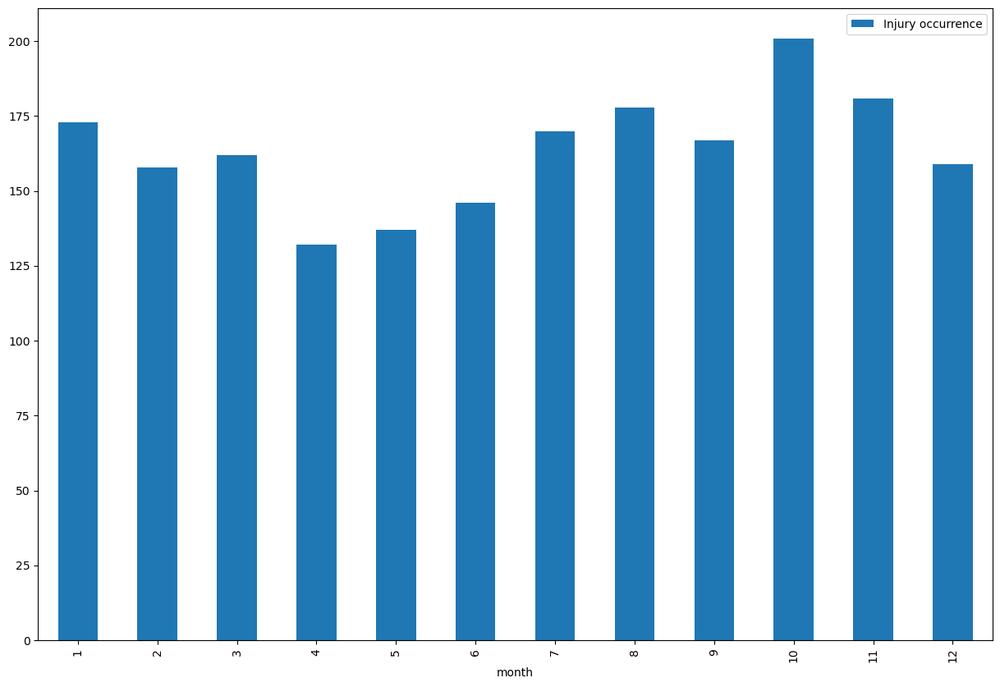

In [97]:
personal_injuries_per_month.plot(x='month', y= 'Injury occurrence', kind='bar')

(1.0, 300.0)

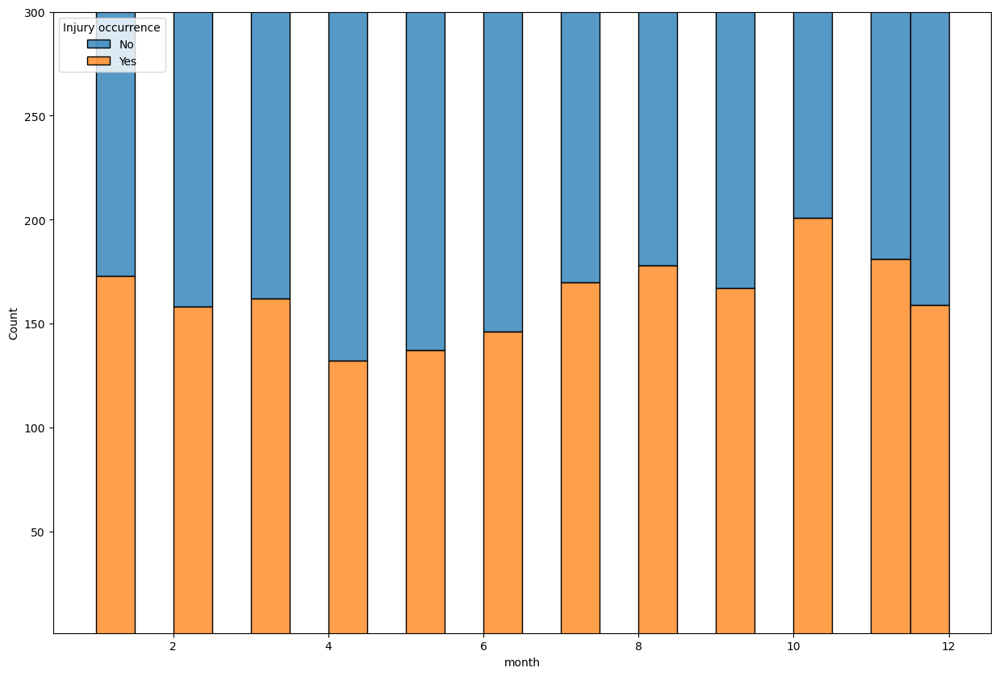

In [98]:
sns.histplot(binwidth=0.5, x="month", hue="Injury occurrence", data=df, stat="count", multiple="stack")
plt.ylim(1,300)

In [99]:
employee_data= df.loc[df['Type of Person']=='Employee']

In [100]:
employee_injuries_per_month = df.groupby(['Type of Person'], as_index = False)['Injury Type'].count()
employee_injuries_per_month

#injury_by_body_part= df.groupby(['Part of Body Affected'], as_index=False)['Injury Type'].count()

,Type of Person,Injury Type
0,Contractor,1522
1,Customer,3
2,Employee,63378
3,Member of the Public,9


(1.0, 2000.0)

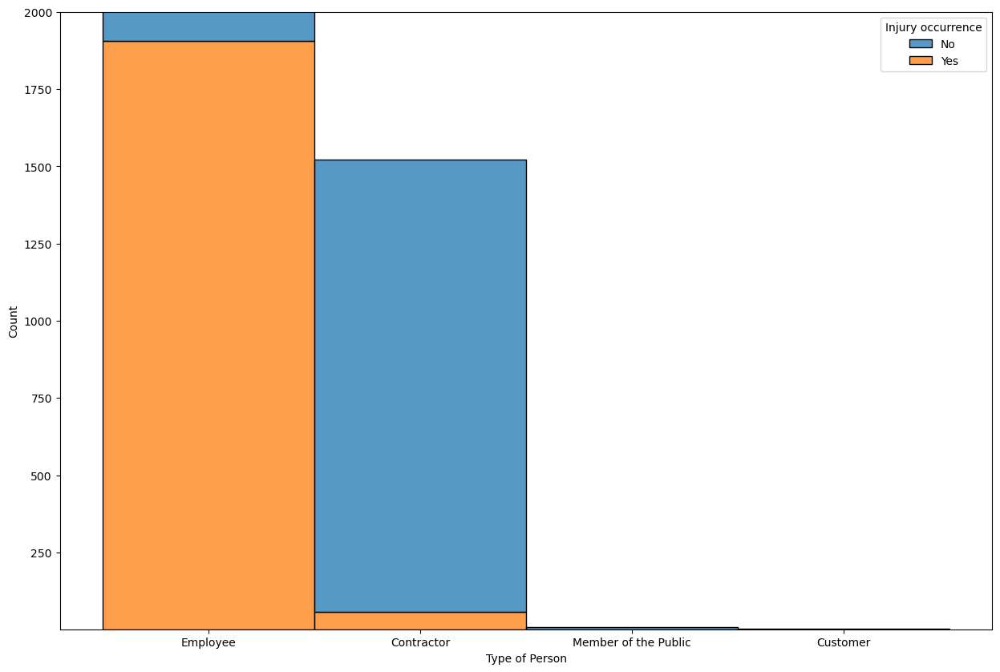

In [101]:
sns.histplot(binwidth=0.5, x="Type of Person", hue="Injury occurrence", data=df, stat="count", multiple="stack")
plt.ylim(1,2000)

In [102]:
df['Event Type'].unique()

array(['Undesired Circumstance / Near Miss', 'Incursion / IPV Strike',
       'Infrastructure / Asset', 'Environmental',
       'Personal illness or injury', 'Structural Safety', 'Security',
       'Facilities / Site', 'Utility Strike'], dtype=object)

Text(0, 0.5, 'Count')

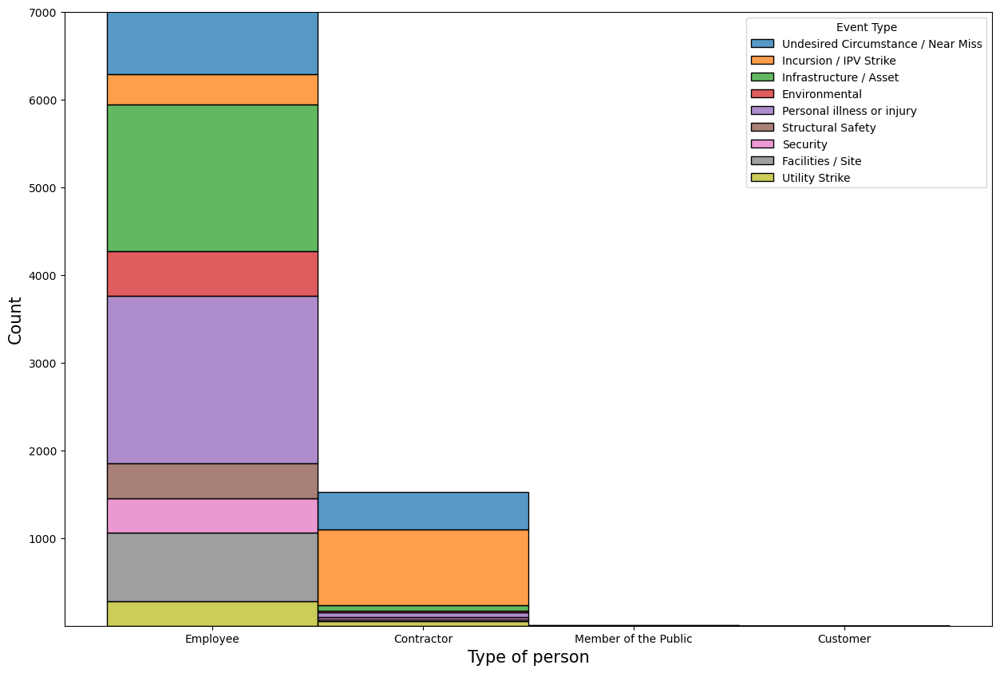

In [103]:
hx=sns.histplot(binwidth=0.5, x="Type of Person", hue="Event Type", data=df, stat="count", multiple="stack")
plt.ylim(1,7000)
plt.xlabel('Type of person', fontsize=15)
plt.ylabel('Count', fontsize=15)

#for c in hx.containers:
   # hx.bar_label(c, fmt='%0.1f',label_type='center')


In [104]:
Employee_data=df.loc[df['Type of Person']=='Employee']

(1.0, 300.0)

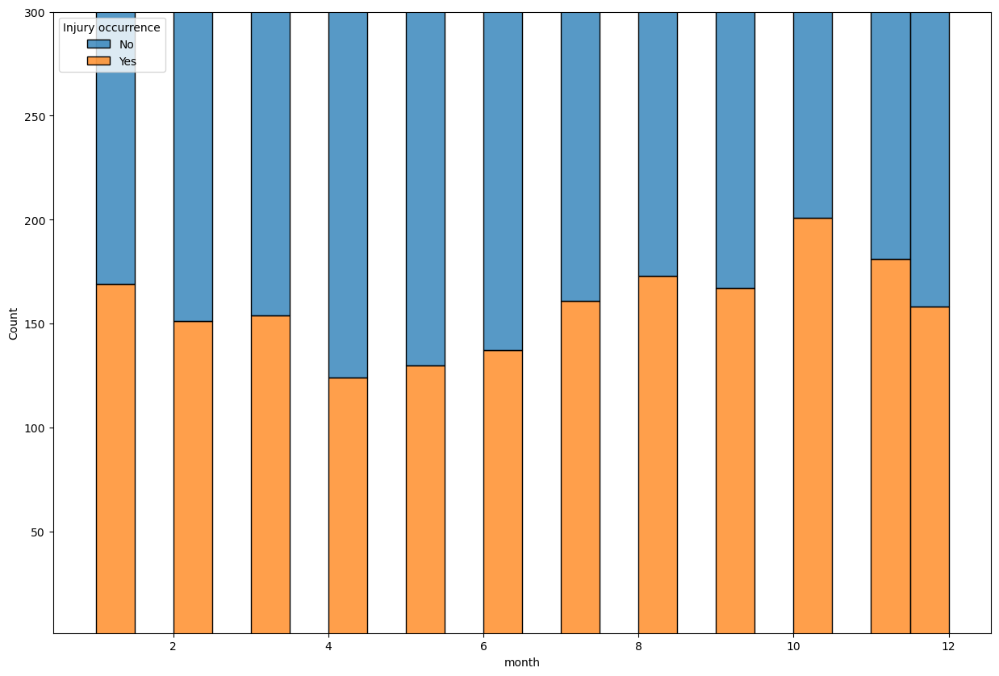

In [105]:
sns.histplot(binwidth=0.5, x="month", hue="Injury occurrence", data=Employee_data, stat="count", multiple="stack")
plt.ylim(1,300)

In [106]:
employee_data['Location'].unique()

array(['Carriageway Slip Rd K', 'Carriageway B', 'Carriageway Slip Rd J',
       nan, 'Carriageway Slip Rd L', 'Office area',
       'Within works area / safety zone (adjacent to a Live carriageway)',
       'Carriageway A', 'Outside works area - adjacent environment',
       'Off Network e.g. Local Authority Road Footpath Marine',
       'Working on SRN', 'Toilets', 'Car Park',
       'Traffic management enclosure',
       'Carriageway not normally trafficked (e.g. chevron area)',
       'Carriageway Slip Rd M',
       'Outside works area / safety zone (adjacent to a Live carriageway)',
       'Works area / safety zone access or exit point',
       'Carriageway hard shoulder', 'Driving for work', 'Central reserve',
       'RCC CCTV observation on network',
       'Outside works area - downstream/wind environment', 'Kitchen',
       'Home Working', 'Reception'], dtype=object)

In [107]:
indexNames = Employee_data[Employee_data['Location'].isin(['Office area', 'Kitchen','Car Park','Reception'])].index

In [108]:
Employee_on_road= Employee_data.drop(indexNames)

(1.0, 300.0)

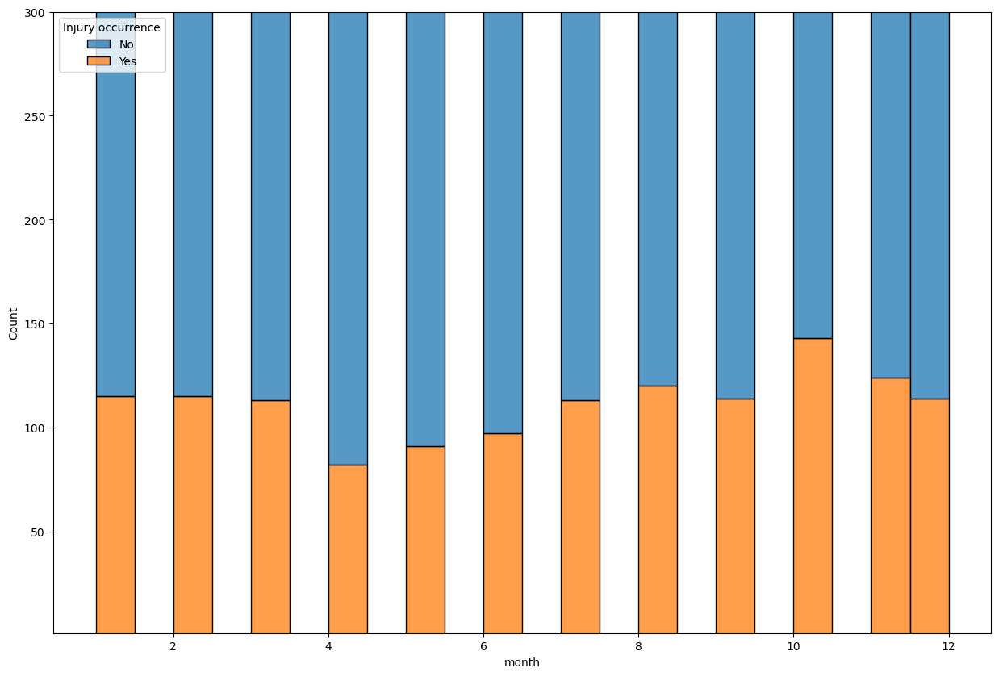

In [109]:
sns.histplot(binwidth=0.5, x="month", hue="Injury occurrence", data=Employee_on_road, stat="count", multiple="stack")
plt.ylim(1,300)

In [110]:
contractor_data= df.loc[df['Type of Person']=='Contractor']

In [111]:
#df['Type of Person'].unique()

(1.0, 80.0)

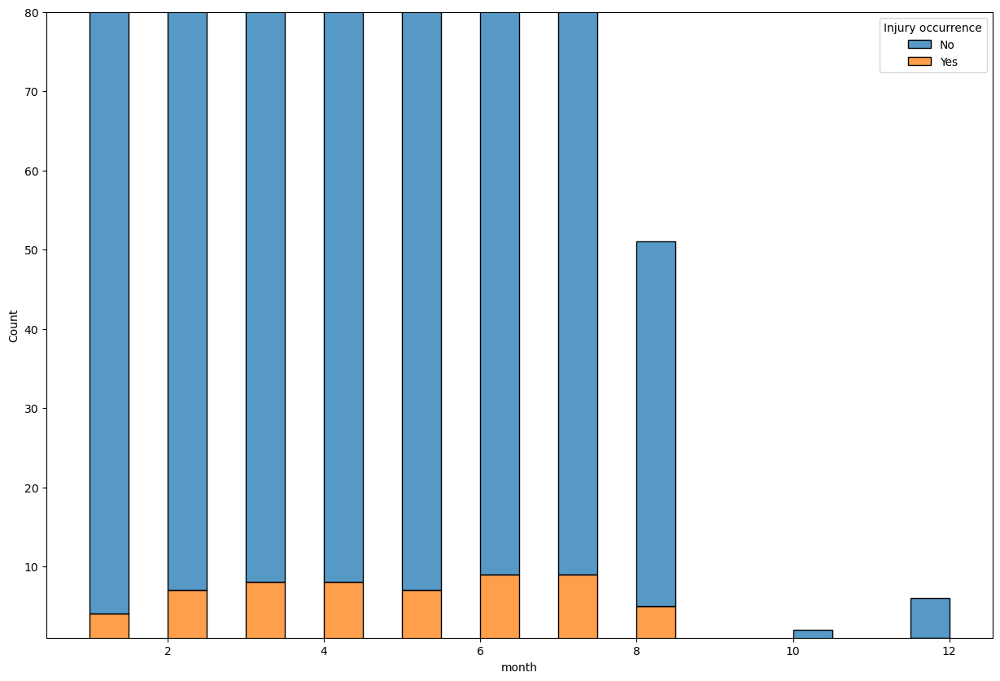

In [112]:
sns.histplot(binwidth=0.5, x="month", hue="Injury occurrence", data=contractor_data, stat="count", multiple="stack")
plt.ylim(1,80)

(1.0, 40.0)

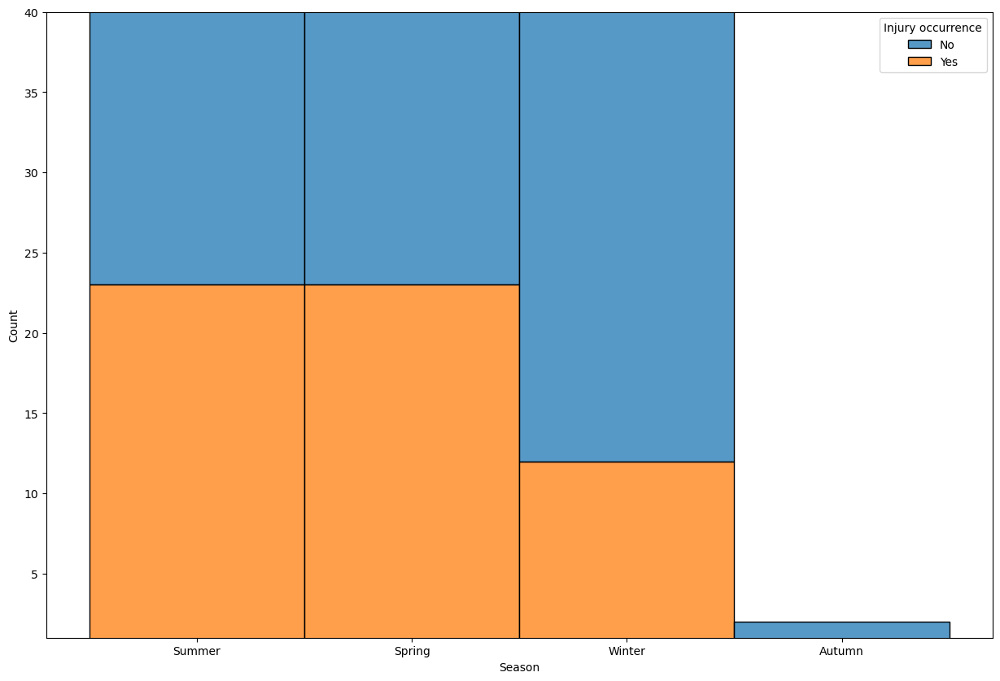

In [113]:
sns.histplot(binwidth=0.5, x="Season", hue="Injury occurrence", data=contractor_data, stat="count", multiple="stack")
plt.ylim(1,40)

(1.0, 1000.0)

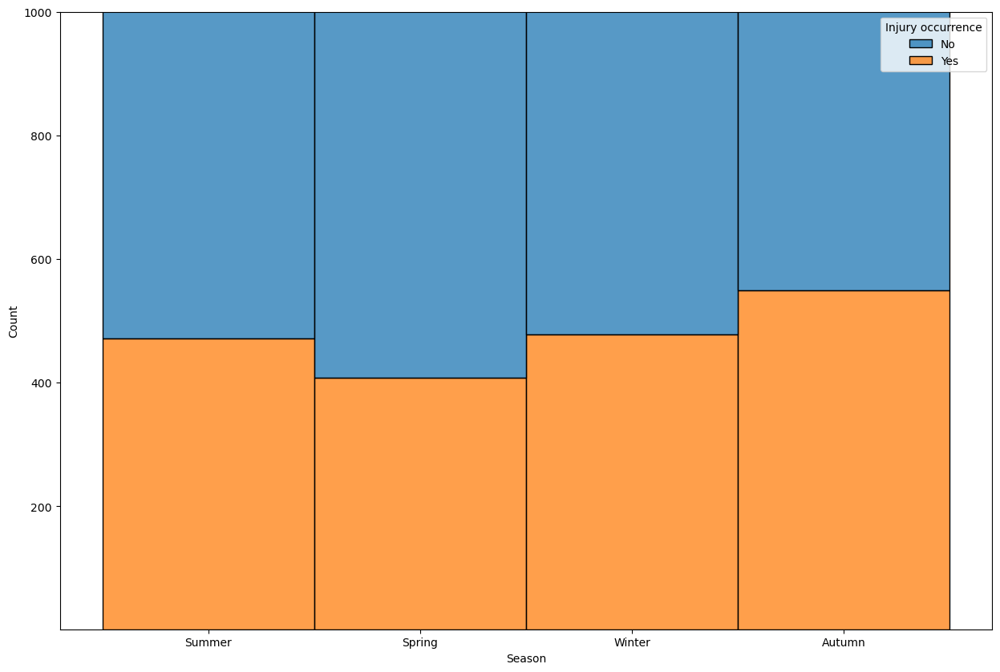

In [114]:
sns.histplot(binwidth=0.5, x="Season", hue="Injury occurrence", data=employee_data, stat="count", multiple="stack")
plt.ylim(1,1000)

(1.0, 600.0)

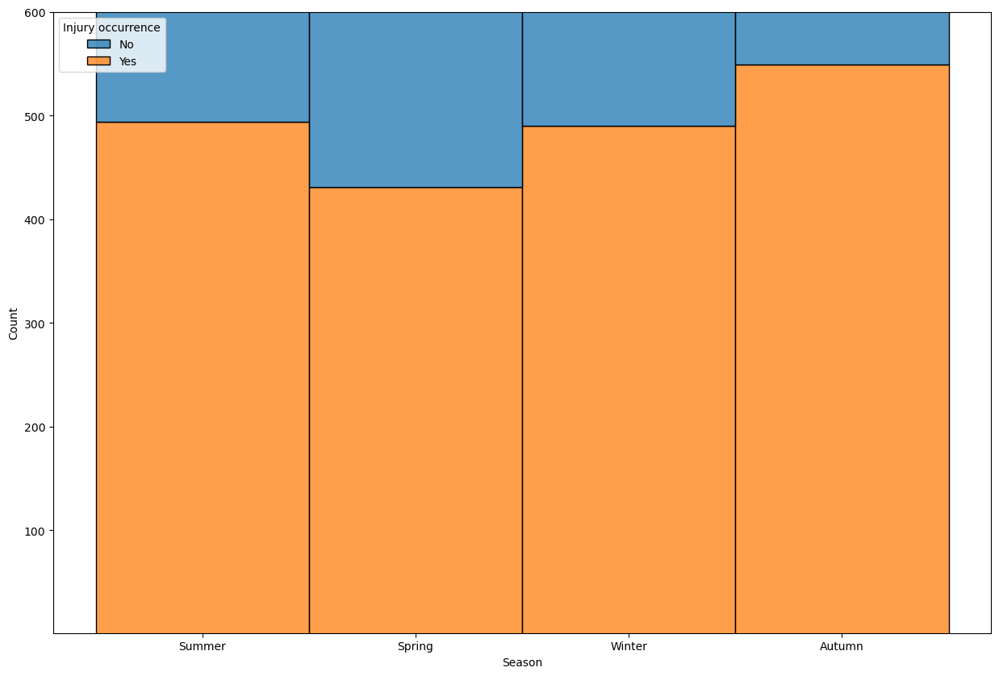

In [115]:
sns.histplot(binwidth=0.5, x="Season", hue="Injury occurrence", data=df, stat="count", multiple="stack")
plt.ylim(1,600)

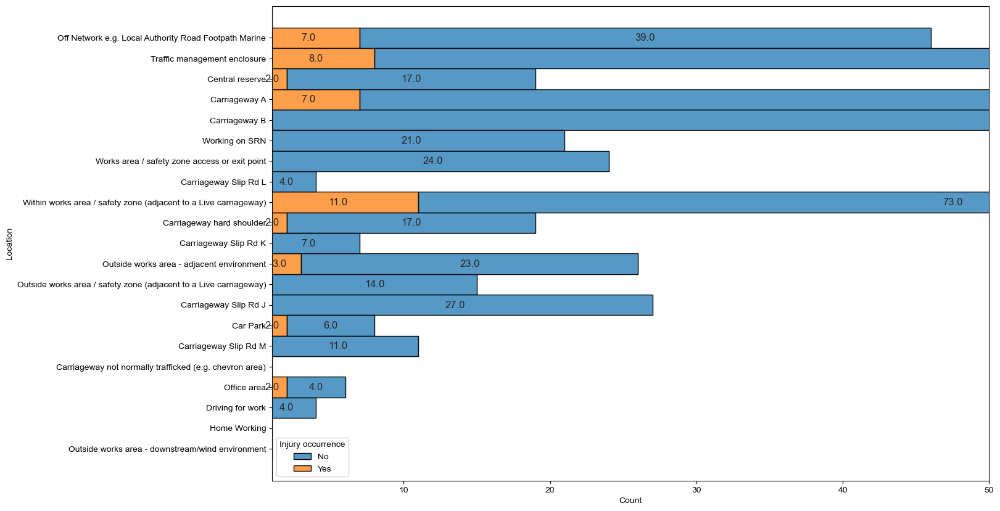

In [116]:
mx=sns.histplot(binwidth=0.5, y="Location", hue="Injury occurrence", data=contractor_data, stat="count", multiple="stack")
plt.xlim(1,50)
sns.set(rc={'figure.figsize':(7,8)})
for c in mx.containers:
    mx.bar_label(c, fmt='%0.1f',label_type='center')
#plt.tick_params(axis='x', which='major', labelsize=__)

In [117]:
df['Location'].unique()

array(['Carriageway Slip Rd K', 'Carriageway B', 'Carriageway Slip Rd J',
       nan, 'Off Network e.g. Local Authority Road Footpath Marine',
       'Carriageway Slip Rd L', 'Office area',
       'Traffic management enclosure', 'Central reserve',
       'Within works area / safety zone (adjacent to a Live carriageway)',
       'Carriageway A', 'Outside works area - adjacent environment',
       'Working on SRN', 'Works area / safety zone access or exit point',
       'Toilets', 'Car Park',
       'Carriageway not normally trafficked (e.g. chevron area)',
       'Carriageway Slip Rd M',
       'Outside works area / safety zone (adjacent to a Live carriageway)',
       'Carriageway hard shoulder', 'Driving for work',
       'RCC CCTV observation on network',
       'Outside works area - downstream/wind environment', 'Kitchen',
       'Home Working', 'Reception'], dtype=object)

In [118]:
b=df.loc[df['Location']=='Office area']#.head(100)
pd.set_option('display.max_rows', df.shape[0]+1)
b

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,vehicles involved?,Type of Person,Location,Did this event occur on the SRN?,Part of Body Affected,...,Actual Severity Rating,month,Season,Type_of_work,Year,Injury occurrence,Project risk level,day_of_week,time,time_of_day
9,131592,South West - Outstations & ROCs,Avonmouth ROC,Infrastructure / Asset,2022-08-09 16:04:00,False,Employee,Office area,0,Not applicable,...,19,8,Summer,Traffic management/control,2022,No,medium,Tuesday,16,Evening
57,131544,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-08 23:47:00,False,Employee,Office area,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Monday,23,Night
59,131542,South West - Outstations & ROCs,Avonmouth ROC,Undesired Circumstance / Near Miss,2022-08-08 20:59:00,False,Employee,Office area,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Monday,20,Night
64,131538,South West - Outstations & ROCs,Avonmouth ROC,Undesired Circumstance / Near Miss,2022-06-24 14:43:00,False,Employee,Office area,0,Not applicable,...,12,6,Summer,Traffic management/control,2022,No,medium,Friday,14,Afternoon
75,131527,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-07 21:31:00,False,Employee,Office area,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Sunday,21,Night
81,131522,East Midlands - Outstations & ROCs,Watford Gap Outstation,Undesired Circumstance / Near Miss,2022-08-08 14:00:00,False,Employee,Office area,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Monday,14,Afternoon
124,131481,South East - Outstations & ROCs,Easton Outstation,Undesired Circumstance / Near Miss,2022-08-07 09:50:00,False,Employee,Office area,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Sunday,9,Morning
140,131465,South West - Outstations & ROCs,Avonmouth ROC,Undesired Circumstance / Near Miss,2022-08-06 15:29:00,False,Employee,Office area,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Saturday,15,Afternoon
147,131458,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-06 10:58:00,False,Employee,Office area,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Saturday,10,Morning
154,131451,Yorkshire & North East - Outstations & ROCs,Calder Park ROC,Undesired Circumstance / Near Miss,2022-08-05 21:03:00,False,Employee,Office area,0,Not applicable,...,12,8,Summer,Traffic management/control,2022,No,medium,Friday,21,Night


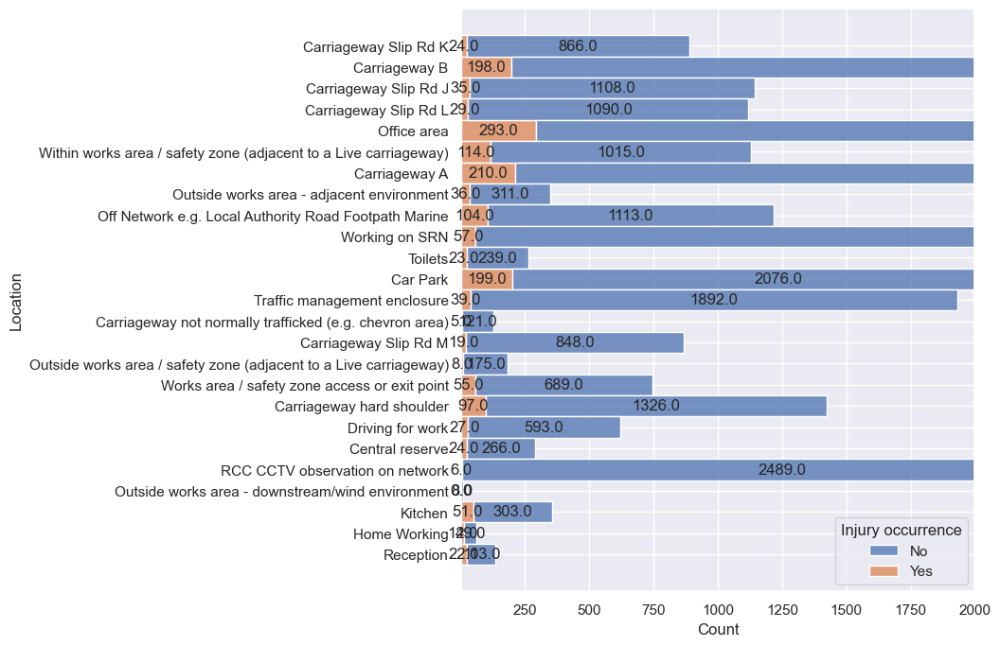

In [119]:
mx=sns.histplot(binwidth=0.5, y="Location", hue="Injury occurrence", data=employee_data, stat="count", multiple="stack")
plt.xlim(1,2000)
#sns.set(rc={'figure.figsize':(7,8)})
for c in mx.containers:
    mx.bar_label(c, fmt='%0.1f',label_type='center')


(1.0, 1000.0)

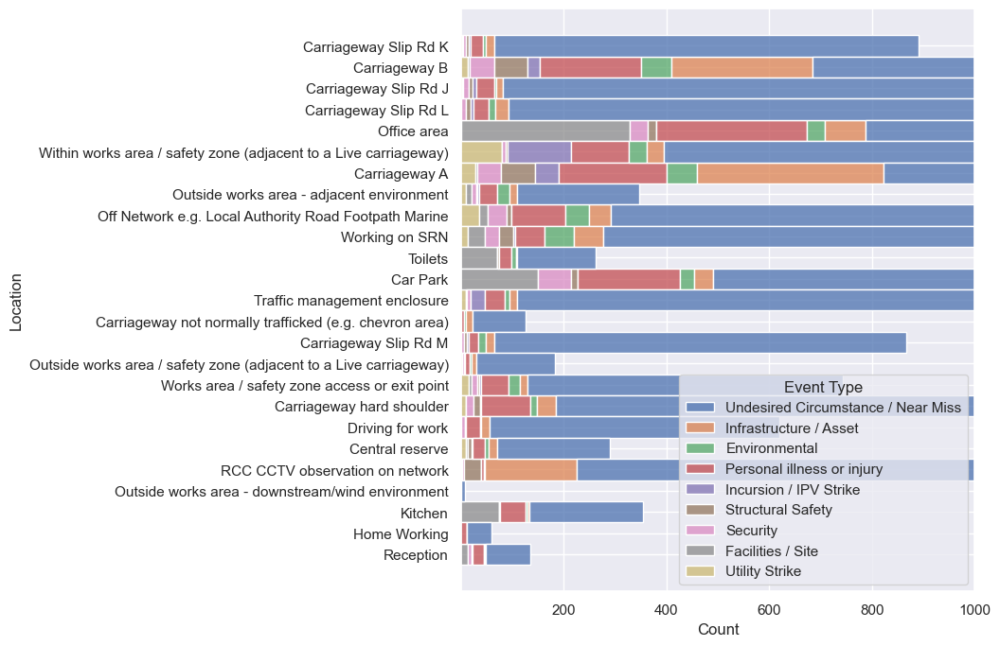

In [120]:
nx=sns.histplot(binwidth=0.5, y="Location", hue="Event Type", data=employee_data, stat="count", multiple="stack")
plt.xlim(1,1000)
#for c in nx.containers:
 #   nx.bar_label(c, fmt='%0.1f',label_type='center')


(1.0, 2000.0)

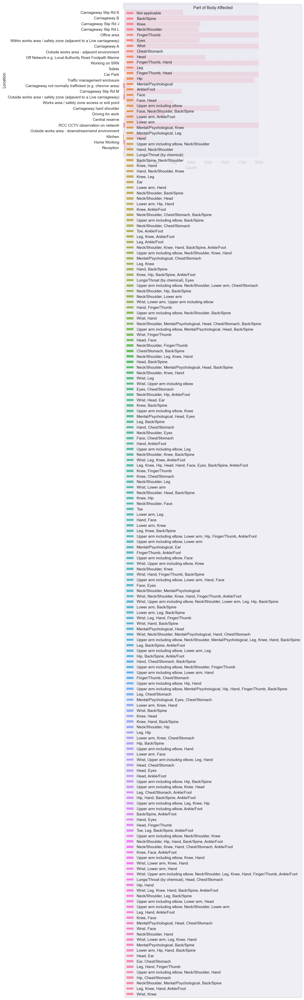

In [121]:
sns.histplot(binwidth=0.5, y="Location", hue="Part of Body Affected", data=employee_data, stat="count", multiple="stack")
plt.xlim(1,2000)


In [122]:
df.describe(include='object')

,Region,Site/Project,Event Type,vehicles involved?,Type of Person,Location,Did this event occur on the SRN?,Part of Body Affected,Injury Type,Weather / Visibility,Season,Type_of_work,Injury occurrence,Project risk level,day_of_week,time_of_day
count,64912,64912,64912,64858,64912,55046,64912,64912,64912,64912,64912,64912,64912,64912,64912,64912
unique,29,288,9,4,4,25,2,184,122,6,4,3,2,3,7,5
top,East - Outstations & ROCs,Area 10,Undesired Circumstance / Near Miss,False,Employee,Carriageway A,0,Not applicable,Not applicable,Not applicable,Autumn,Traffic management/control,No,medium,Wednesday,Morning
freq,12542,5889,57515,60056,63378,12216,57021,62979,63112,62277,17231,63378,62948,59813,11183,18341


In [123]:
df.describe()

,PublishedRecordId,Experience in Current Role,Age Range,Potential Severity Rating,Actual Severity Rating,month,Year,time
count,64912.000000,64912.000000,64912.000000,64912.000000,64912.000000,64912.000000,64912.000000,64912.000000
mean,52329.704631,11.991450,38.535032,12.417319,12.384428,6.542750,2020.190674,12.671863
std,32693.499720,6.657656,12.089580,6.881501,2.948331,3.444392,1.168804,6.394746
min,8056.000000,1.000000,18.000000,1.000000,1.000000,1.000000,2018.000000,0.000000
25%,28633.750000,6.000000,28.000000,7.000000,12.000000,3.000000,2019.000000,8.000000
50%,45033.500000,12.000000,39.000000,12.000000,12.000000,7.000000,2020.000000,13.000000
75%,62399.250000,18.000000,49.000000,18.000000,12.000000,10.000000,2021.000000,18.000000
max,131601.000000,23.000000,59.000000,25.000000,25.000000,12.000000,2022.000000,23.000000


Text(0, 0.5, 'time')

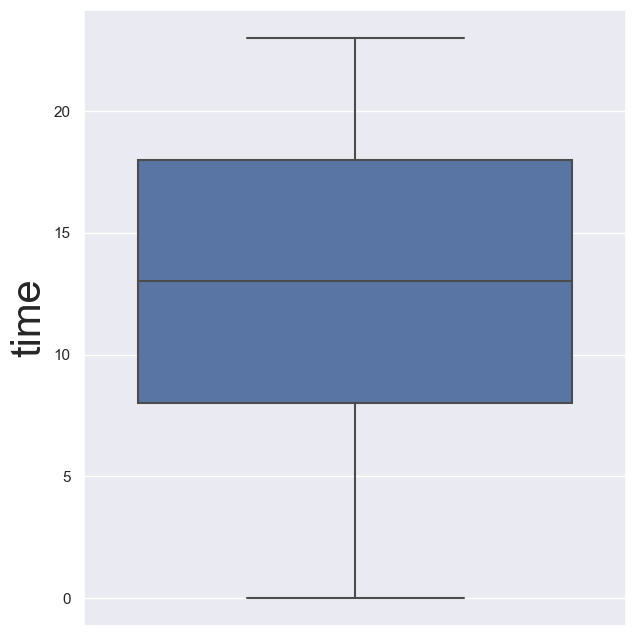

In [124]:
sns.boxplot(y=df['time'])

plt.ylabel('time', fontsize= 30)

In [125]:
df['Injury Type'].unique()

array(['Not applicable', 'Strain / sprain', 'Other', 'Cut / laceration',
       'Fracture', 'Swelling / Oedema', 'Puncture Wound', 'Foreign body',
       'Musculoskeletal', 'Abrasion', 'Crush',
       'Swelling / Oedema, Bruising, Cut / laceration',
       'Abrasion, Strain / sprain', 'Amputation', 'Bruising',
       'Bruising, Cut / laceration', 'Visual Issues', 'Ingestion',
       'Scald / burn (non-chemical)',
       'Abrasion, Bruising, Cut / laceration',
       'Swelling / Oedema, Abrasion, Bruising, Cut / laceration',
       'Contact / exposure (chemicals)', 'Dislocation, Fracture',
       'Scald / burn (non-chemical), Bruising', 'Cut / laceration, Crush',
       'Musculoskeletal, Strain / sprain, Cut / laceration',
       'Dislocation', 'Bruising, Abrasion',
       'Swelling / Oedema, Strain / sprain, Bruising',
       'Swelling / Oedema, Bruising, Strain / sprain',
       'Abrasion, Cut / laceration', 'Strain / sprain, Cut / laceration',
       'Strain / sprain, Musculoskeletal

In [126]:
df['Injury Type'].nunique()

122

In [127]:
df.loc[df['Injury Type'].str[:3] == 'Cut', 'Injury Type'] = 'Cut/laceration'
df.loc[df['Injury Type'].str[:4] == 'Swel', 'Injury Type'] = 'Swelling/Oedema'
df.loc[df['Injury Type'].str[:4] == 'Stra', 'Injury Type'] = 'Strain/sprain'
df.loc[df['Injury Type'].str[:4] == 'Cont', 'Injury Type'] = 'Contact/exposure(chemicals)'
df.loc[df['Injury Type'].str[:4] == 'Stra', 'Injury Type'] = 'Strain/sprain'
df.loc[df['Injury Type'].str[:4] == 'Abra', 'Injury Type'] = 'Abrasion'
df.loc[df['Injury Type'].str[:4] == 'Musc', 'Injury Type'] = 'Musculoskeletal'
df.loc[df['Injury Type'].str[:4] == 'Brui', 'Injury Type'] = 'Bruising'
df.loc[df['Injury Type'].str[:4] == 'Frac', 'Injury Type'] = 'Fracture'
df.loc[df['Injury Type'].str[:4] == 'Punc', 'Injury Type'] = 'Puncture Wound'
df.loc[df['Injury Type'].str[:4] == 'Disl', 'Injury Type'] = 'Dislocation'
df.loc[df['Injury Type'].str[:4] == 'Othe', 'Injury Type'] = 'Other'
df.loc[df['Injury Type'].str[:4] == 'Fore', 'Injury Type'] = 'Foreign body'
df.loc[df['Injury Type'].str[:4] == 'Asph', 'Injury Type'] = 'Asphyxiation'
df.loc[df['Injury Type'].str[:4] == 'Crus', 'Injury Type'] = 'Crush'
df.loc[df['Injury Type'].str[:4] == 'Ampu', 'Injury Type'] = 'Amputation'
df.loc[df['Injury Type'].str[:4] == 'Visu', 'Injury Type'] = 'Visual Issues'
df.loc[df['Injury Type'].str[:4] == 'Inge', 'Injury Type'] = 'Ingestion'
df.loc[df['Injury Type'].str[:4] == 'Scal', 'Injury Type'] = 'Scald/burn(non-chemical)'
df.loc[df['Injury Type'].str[:4] == 'Conc', 'Injury Type'] = 'Concussion'
df.loc[df['Injury Type'].str[:4] == 'Elec', 'Injury Type'] = 'Electric shock'

In [128]:
df['Injury Type'].nunique()

20

In [129]:
df['Injury Type'].unique()

array(['Not applicable', 'Strain/sprain', 'Other', 'Cut/laceration',
       'Fracture', 'Swelling/Oedema', 'Puncture Wound', 'Foreign body',
       'Musculoskeletal', 'Abrasion', 'Crush', 'Amputation', 'Bruising',
       'Visual Issues', 'Ingestion', 'Scald/burn(non-chemical)',
       'Contact/exposure(chemicals)', 'Dislocation', 'Concussion',
       'Electric shock'], dtype=object)

(1.0, 5000.0)

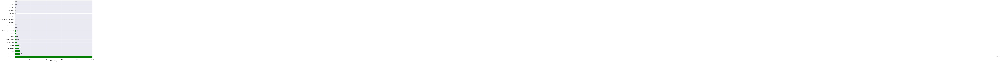

In [130]:
rcParams['figure.figsize']= 20,15
b=df['Injury Type'].value_counts()
ax= df['Injury Type'].value_counts().plot(kind='barh', fontsize=15, color='green')
#ax.set_facecolor(color="green")
[ax.text(a, i, '{:.2f}%'.format(100*a/64912)) for i, a in enumerate(b)]
plt.xlabel('Frequency', fontsize='20')
plt.xlim(1,5000)

In [131]:
injury_count=df['Injury Type'].value_counts()

Text(0, 0.5, 'Injury Type')

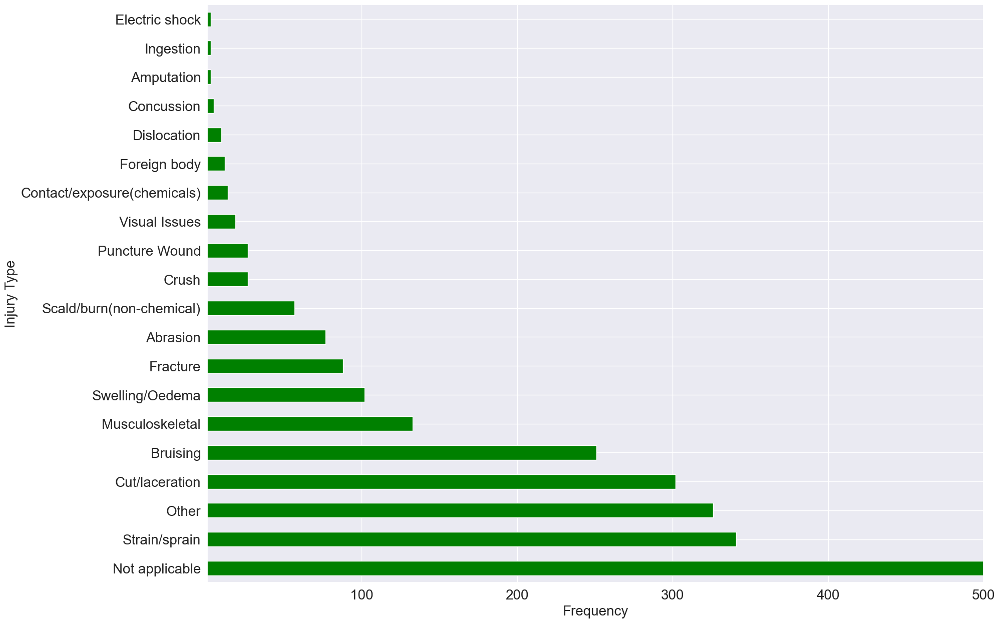

In [132]:
injury_count.plot(kind='barh', fontsize= 20, color='green')
plt.xlim(1,500)
plt.xlabel('Frequency', fontsize=20)
plt.ylabel('Injury Type', fontsize=20)

In [149]:
df['Type_of_work'].unique()

array(['Traffic management/control', 'Highway construction work',
       'Not applicable'], dtype=object)

In [150]:
on_road= df.loc[df['Type_of_work']=='Highway construction work']

In [151]:
on_road

,PublishedRecordId,Region,Site/Project,Event Type,Date and Time of Event,vehicles involved?,Type of Person,Location,Did this event occur on the SRN?,Part of Body Affected,...,Actual Severity Rating,month,Season,Type_of_work,Year,Injury occurrence,Project risk level,day_of_week,time,time_of_day
4,131597,East - Operations,DBFO - M40 J1-15 Denham to Warwick (area 30),Undesired Circumstance / Near Miss,2022-08-08 12:30:00,False,Contractor,Off Network e.g. Local Authority Road Footpath...,0,Not applicable,...,12,8,Summer,Highway construction work,2022,No,medium,Monday,12,Afternoon
6,131595,East - Operations,Area 6 & 8,Incursion / IPV Strike,2022-08-09 01:00:00,True,Contractor,NaN,0,Not applicable,...,1,8,Summer,Highway construction work,2022,No,low,Tuesday,1,0
10,131591,South East - Major Projects,MP-0169 - M27 J4 to 11,Incursion / IPV Strike,2022-08-09 02:20:00,True,Contractor,Traffic management enclosure,0,Not applicable,...,22,8,Summer,Highway construction work,2022,No,High,Tuesday,2,0
13,131588,South West - Operations,Area 1 & 2,Undesired Circumstance / Near Miss,2022-08-08 10:00:00,False,Contractor,Central reserve,0,Not applicable,...,12,8,Summer,Highway construction work,2022,No,medium,Monday,10,Morning
24,131577,North West - Major Projects,MP-0206 - M56 J6 to j8,Undesired Circumstance / Near Miss,2022-08-08 14:30:00,False,Contractor,NaN,0,Not applicable,...,12,8,Summer,Highway construction work,2022,No,medium,Monday,14,Afternoon
25,131576,South West - Operations,AD - M&R - One,Undesired Circumstance / Near Miss,2022-08-09 00:15:00,False,Contractor,Carriageway A,0,Not applicable,...,12,8,Summer,Highway construction work,2022,No,medium,Tuesday,0,0
28,131573,Yorkshire & North East - Major Projects,MP-0116 - A63 Castle Street - RIP,Incursion / IPV Strike,2022-08-08 22:24:00,True,Contractor,Carriageway B,0,Not applicable,...,4,8,Summer,Highway construction work,2022,No,low,Monday,22,Night
39,131562,North West - Operations,AD - Construction - Ten,Incursion / IPV Strike,2022-08-04 22:48:00,True,Contractor,Working on SRN,Yes,Not applicable,...,2,8,Summer,Highway construction work,2022,No,low,Thursday,22,Night
40,131561,East - Operations,Area 6 & 8,Undesired Circumstance / Near Miss,2022-08-08 18:30:00,False,Contractor,Works area / safety zone access or exit point,0,Not applicable,...,12,8,Summer,Highway construction work,2022,No,medium,Monday,18,Evening
47,131554,South East - Major Projects,MP-0155 - M3 J9 to 14 - SMA,Incursion / IPV Strike,2022-08-06 12:45:00,True,Contractor,Central reserve,0,Not applicable,...,3,8,Summer,Highway construction work,2022,No,low,Saturday,12,Afternoon


In [152]:
eventloc2= on_road.groupby("Location")['Event Type'].count()
eventlocplot2= eventloc2.sort_values()
eventlocplot2

Location
Outside works area - downstream/wind environment                       1
Home Working                                                           1
Carriageway not normally trafficked (e.g. chevron area)                1
Carriageway Slip Rd L                                                  4
Driving for work                                                       4
Carriageway Slip Rd K                                                  7
Car Park                                                               8
Carriageway Slip Rd M                                                 11
Outside works area / safety zone (adjacent to a Live carriageway)     15
Central reserve                                                       19
Carriageway hard shoulder                                             19
Working on SRN                                                        21
Works area / safety zone access or exit point                         24
Outside works area - adjacent environment 

Text(0, 0.5, 'locations')

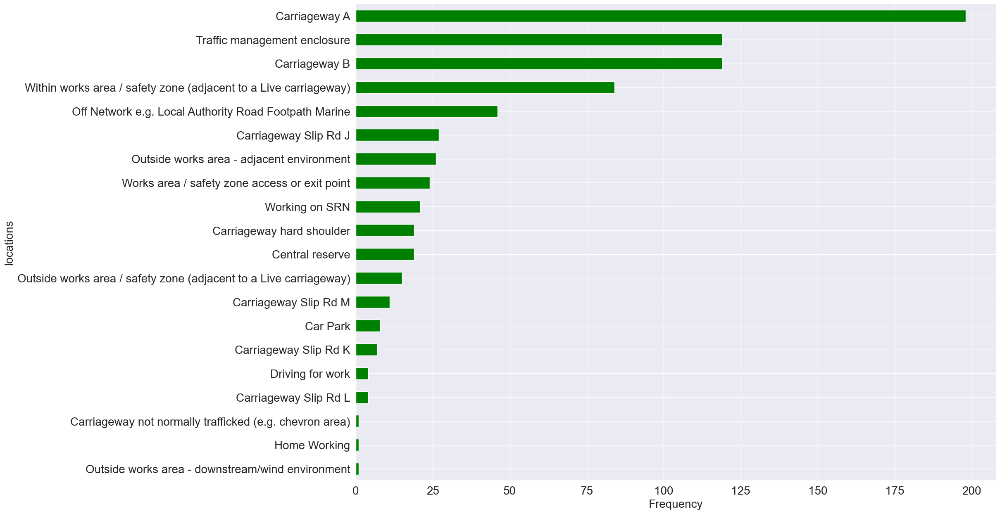

In [154]:
eventlocplot2.plot(kind='barh', fontsize= 20, color='green')
plt.xlabel('Frequency', fontsize= 20)
plt.ylabel('locations', fontsize= 20)
#eventlocplot2.plot(kind='barh', color='green')